#### Ski Resort Project University of Zürich 2020
## The test notebook for case 1: Sattel-Hochstuckli 800-1600m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


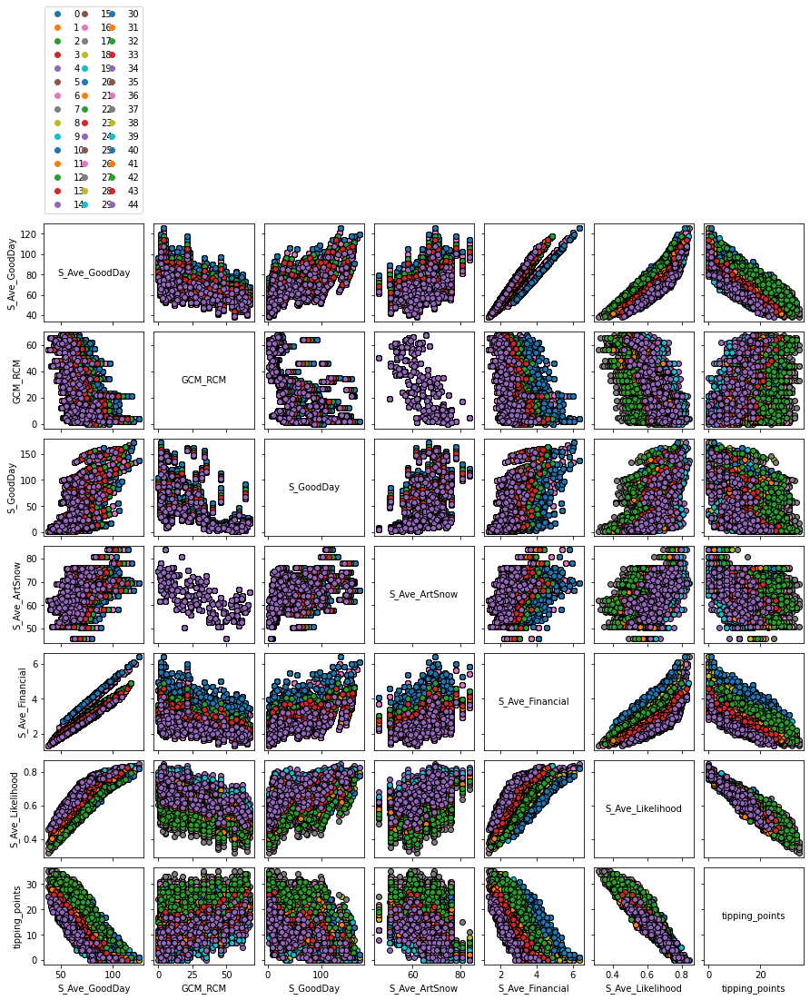

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [10]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [11]:
print(outcomes2)

{'S_Ave_GoodDay': array([73.96093493, 67.54697912, 62.24208232, ..., 65.54935272,
       77.54090941, 50.94716394]), 'S_GoodDay': array([[ 75.64503571, 157.69      ,  94.29357143, ...,  33.53617857,
          9.50889286,   9.94228571],
       [110.17428571,  87.72410714, 156.70542857, ...,  12.677     ,
          6.20742857,   8.16996429],
       [ 94.10532143,  53.93671429,  28.59896429, ...,  33.55992857,
         16.52864286,  43.25332143],
       ...,
       [ 72.10665517, 153.66355172,  91.43424138, ...,  30.52513793,
          4.55862069,   9.05793103],
       [ 63.66475862, 136.13682759,  62.86596552, ..., 135.06831034,
        109.50593103, 137.3427931 ],
       [ 82.10448276,  92.06737931, 132.854     , ...,  20.17224138,
          6.99706897,  11.84375862]]), 'S_Ave_ArtSnow': array([60.71398305, 63.96127119, 66.28932203, ..., 56.64279661,
       72.6609322 , 62.8059322 ]), 'S_Ave_Financial': array([2.84711864, 2.59737288, 2.35542373, ..., 2.43940678, 2.88830508,
       1.8607

In [12]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [13]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


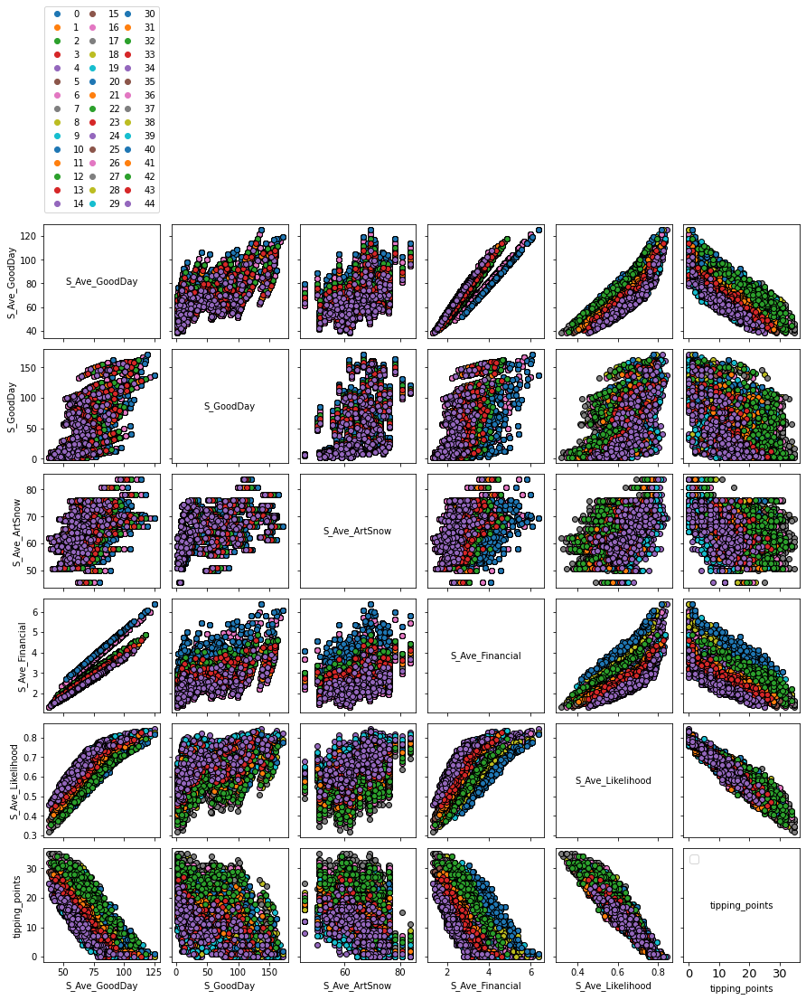

In [14]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [15]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [16]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [17]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.280125,966.374766,5.184639,-1.039813,1.242465,0.374973,3.0,280.0,70.0,0,0,UZHModel,73.960935,48,75.645036,157.690000,94.293571,70.503250,146.236607,89.329500,137.440357,134.510500,102.111357,32.255464,92.737250,118.818464,82.988429,88.253893,144.858750,119.930393,73.762964,88.762750,42.870571,87.304607,...,25.785214,16.345750,88.790893,54.888929,4.762214,67.200214,58.630071,93.762321,15.226107,8.636571,18.418143,23.633429,10.794000,106.698714,17.580429,61.595357,71.650679,8.407071,50.052036,5.769643,52.325607,7.320643,1.991750,51.452607,7.657179,91.347643,29.805964,33.536179,9.508893,9.942286,60.713983,2.847119,0.638726,10.0
1,1.541020,928.513753,5.881729,-1.156852,2.324987,0.669910,3.0,280.0,70.0,1,0,UZHModel,67.546979,57,110.174286,87.724107,156.705429,72.402464,131.767429,120.549786,72.259250,104.314036,130.872464,117.584179,126.196107,92.382464,71.299929,177.088500,107.840250,121.971429,126.946036,124.285571,118.757286,95.929786,...,16.774000,41.666536,16.462714,32.495250,23.050286,15.670964,61.855107,49.004429,13.861571,30.115679,70.056143,16.226000,10.629643,13.091321,11.404000,43.563357,10.913571,15.540821,67.221571,53.649214,26.501536,2.156286,12.309679,46.716714,35.754000,7.730071,32.523643,12.677000,6.207429,8.169964,63.961271,2.597373,0.631915,17.0
2,1.061103,931.486859,5.353891,-1.800889,2.741733,0.884879,1.0,280.0,70.0,2,0,UZHModel,62.242082,10,94.105321,53.936714,28.598964,54.906321,98.319714,84.025536,130.471429,109.338643,104.208214,63.540500,81.910357,101.876464,131.732536,107.653643,60.631821,97.707321,114.748286,111.562857,42.327750,66.865357,...,23.276500,26.441429,55.539607,41.851929,48.785714,108.493679,106.142036,42.388286,32.492179,31.072321,34.107571,26.162500,54.323536,28.768964,61.834393,32.192786,37.436393,7.258643,17.496571,50.479250,19.408143,11.167286,71.070714,38.156107,106.857500,22.405750,38.735429,33.559929,16.528643,43.253321,66.289322,2.355424,0.635062,17.0
3,1.590828,1018.496944,5.248490,-1.034257,1.607127,0.102415,2.0,280.0,70.0,3,0,UZHModel,62.621791,14,33.851393,23.153286,98.400929,68.054786,65.541857,89.851250,142.073857,133.641429,113.549071,111.044821,107.578071,41.487464,100.735821,117.835643,61.269214,91.489964,68.438893,59.240214,37.753786,50.402571,...,22.782357,131.757071,9.839571,97.994250,53.012214,25.702607,31.758893,54.814286,58.905714,21.087179,75.238464,26.464357,84.034679,124.832214,8.364857,69.882893,57.183214,85.443679,53.765750,21.027607,8.718536,69.188750,58.197964,38.986964,10.170643,96.183714,51.763714,4.991893,70.761643,100.798679,72.596271,2.370424,0.631841,14.0
4,1.156649,1051.926972,4.753099,-1.233790,2.793135,0.776850,3.0,280.0,70.0,4,0,UZHModel,46.345783,60,78.485929,96.116679,128.959286,42.972393,64.635321,83.929500,69.480000,103.928000,113.983821,95.126250,44.293571,98.843429,84.903250,103.324143,57.082964,87.696036,72.270179,110.422143,77.968857,84.824286,...,17.680286,30.805750,7.271893,8.222393,7.370143,30.221679,67.147857,32.984179,4.037036,26.075893,9.104786,27.428643,1.695929,49.268571,3.150750,3.154857,2.740929,7.888000,8.395179,45.222536,12.435357,16.945357,10.060393,13.255143,4.717857,27.479000,3.158036,5.834000,18.150250,4.971214,59.112034,1.733983,0.492170,22.0


In [18]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [19]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [20]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [21]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [22]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [23]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [24]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [25]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [26]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_85_21
Money_sc_85_21
ArtSnowPossibility_sc_85_21
isOverSnow_sc_85_21


In [27]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [28]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [29]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [30]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [31]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[35.71185833]
[53.76868981]
[77.96619545]
[96.99321023]
[115.56022273]
(118, 1)
[1.399]
[2.13]
[3.13]
[4.15]
[5.12]
(118, 1)
[53.015]
[59.4725]
[67.93]
[78.69]
[88.632]
(118, 1)
[45.04755556]
[66.71127974]
[95.93883333]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [32]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

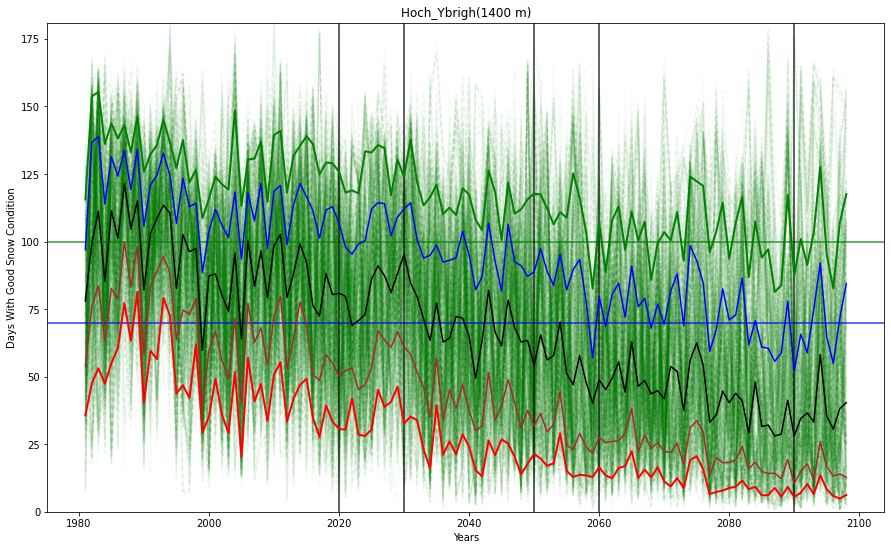

In [33]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

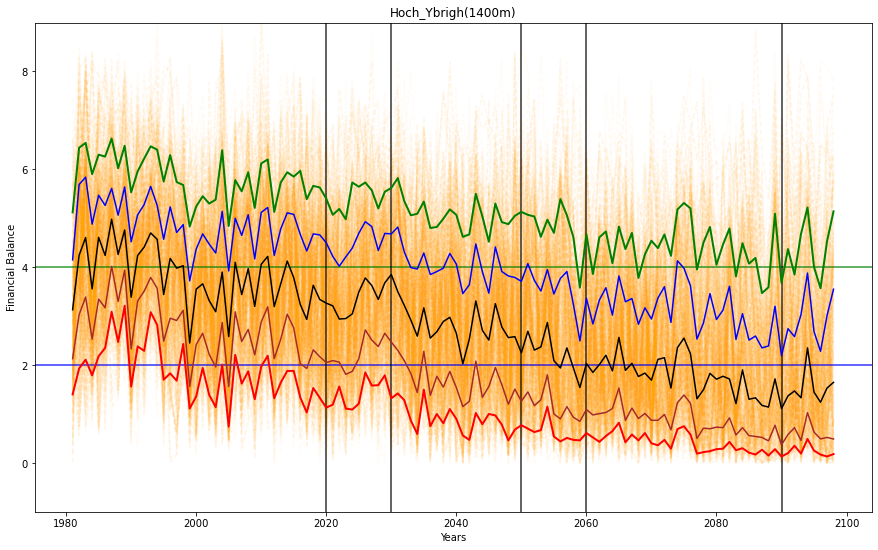

In [34]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

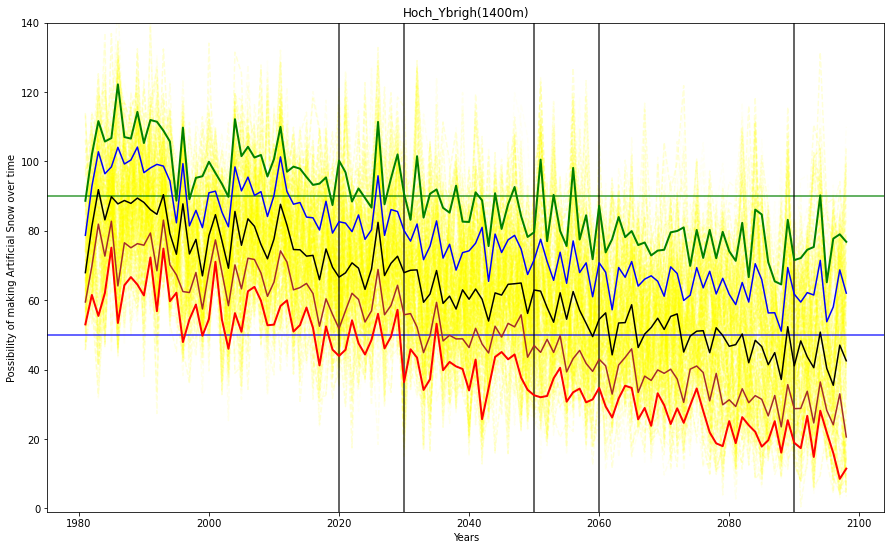

In [35]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

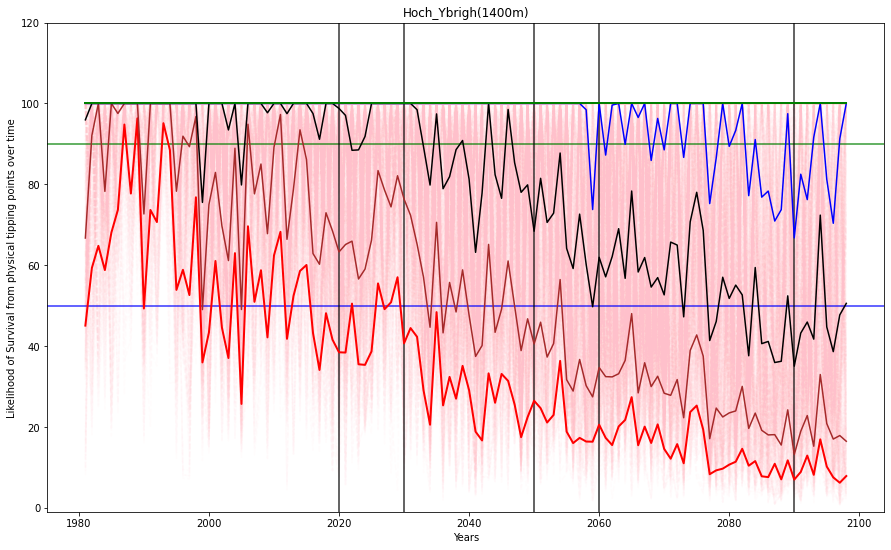

In [36]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [43]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 60
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 2250 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mea

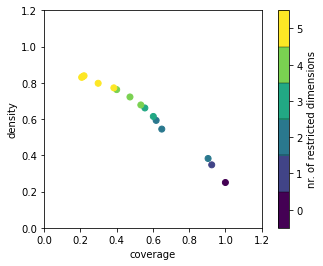

<Figure size 432x288 with 0 Axes>

In [44]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage         0.22
density      0.838983
id                 15
mass        0.0655556
mean         0.838983
res_dim             5
Name: 15, dtype: object

                         box 15                  \
                            min             max   
xRCP                        2.5               3   
x1SnowThershold  {290.0, 300.0}  {290.0, 300.0}   
Xfactor1               0.708483         3.48386   
X3iPot                  906.042         1099.16   
X6tempArt              -1.97766        -1.00437   

                                                 
                                      qp values  
xRCP             [1.6867608467297034e-70, -1.0]  
x1SnowThershold  [1.1929365894809016e-52, -1.0]  
Xfactor1           [0.011557957172387686, -1.0]  
X3iPot              [0.06808090001818579, -1.0]  
X6tempArt           [0.20149580355570149, -1.0]  



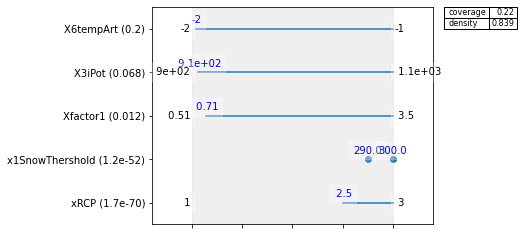

In [45]:
# Saeed : explore the inspect effect
box1.inspect(15)
box1.inspect(15, style='graph')
plt.show()

x1SnowThershold [290.0, 300.0, 260.0, 200.0, 270.0, 240.0, 280.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


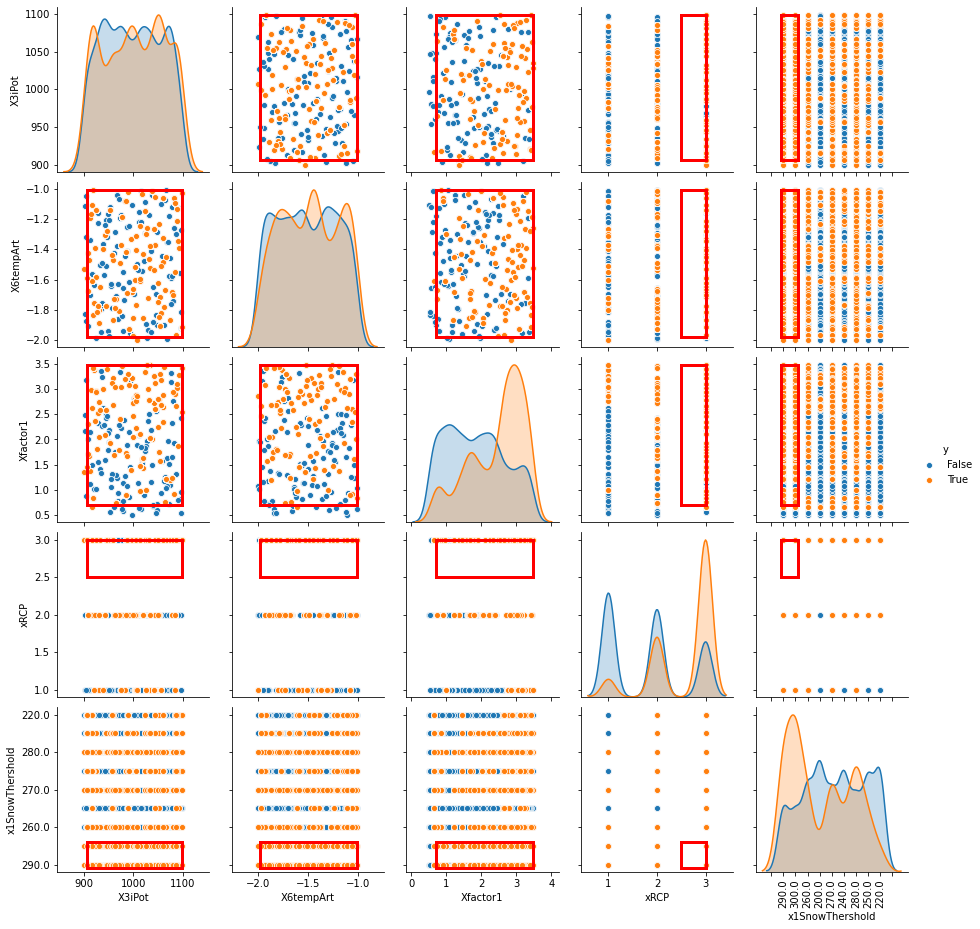

In [46]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(15)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [47]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 8410 points remaining, containing 1755 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.7608695652173914, mass: 0.051111111111111114, coverage: 0.15555555555555556, density: 0.7608695652173914 restricted_dimensions: 7


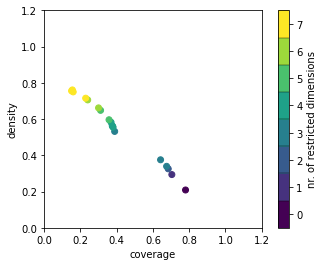

In [48]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

coverage         0.16
density          0.75
id                 15
mass        0.0533333
mean             0.75
res_dim             7
Name: 15, dtype: object

                         box 15                  \
                            min             max   
X5temp                  4.50681         5.86179   
xRCP                        2.5               3   
x1SnowThershold  {280.0, 270.0}  {280.0, 270.0}   
X3iPot                  906.042         1099.16   
Xfactor1               0.708483         3.48386   
X6tempArt              -1.94144        -1.00437   
xClimateModel         0.0256398        0.999544   

                                                 
                                      qp values  
X5temp              [-1.0, 0.09449661589915702]  
xRCP              [5.511853069377176e-58, -1.0]  
x1SnowThershold  [1.8530084230249877e-30, -1.0]  
X3iPot              [0.12406922511796241, -1.0]  
Xfactor1            [0.12406922511796241, -1.0]  
X6tempArt            [0.250116952

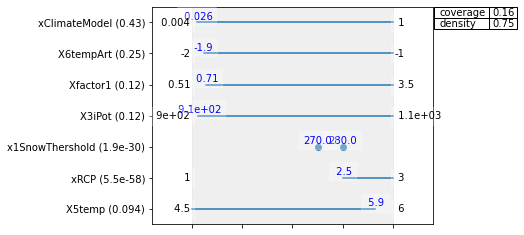

In [49]:
# Saeed : explore the inspect effect
box2.inspect(15)
box2.inspect(15, style='graph')
plt.show()

x1SnowThershold [280.0, 270.0, 290.0, 260.0, 200.0, 300.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


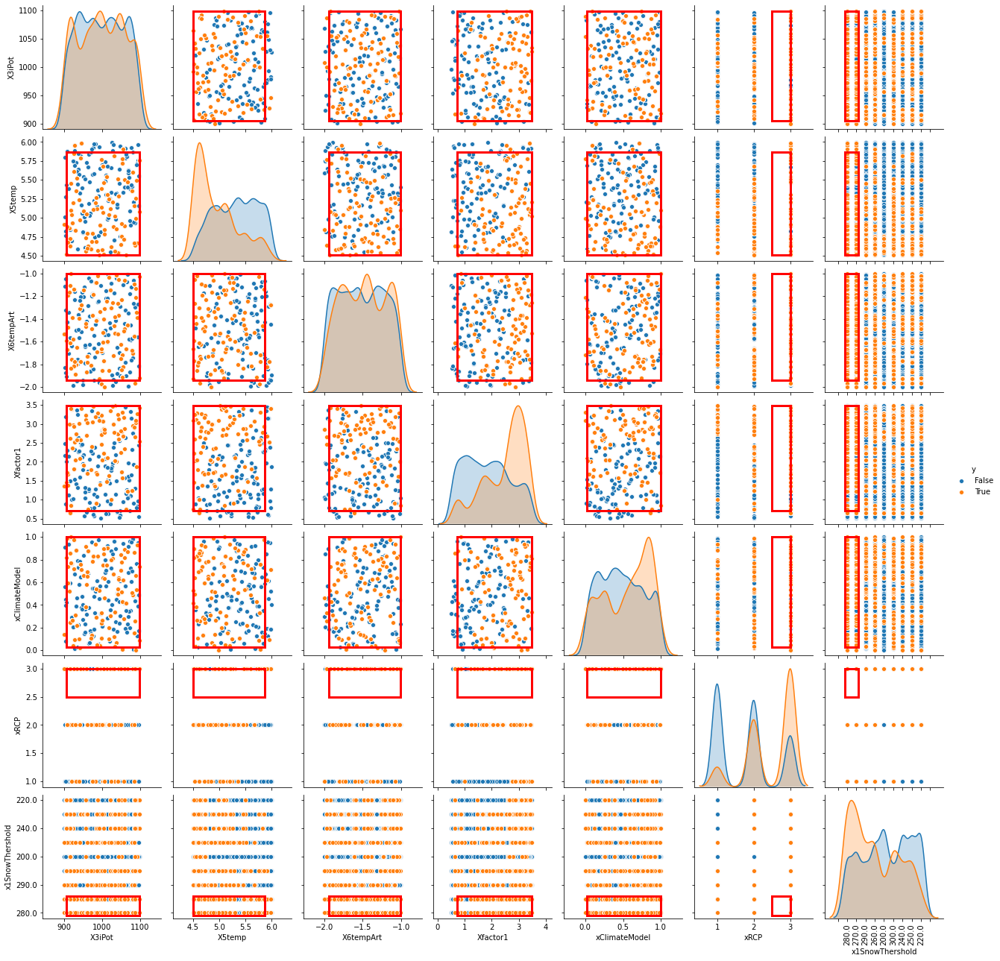

In [50]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(15)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [51]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 60
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 2430 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.17, coverage: 0.6296296296296297, density: 1.0 restricted_dimensions: 3


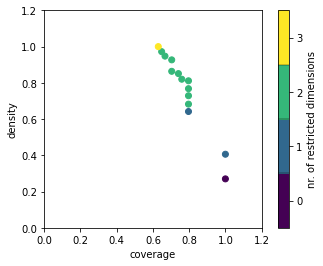

In [52]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.648148
density     0.972222
id                12
mass            0.18
mean        0.972222
res_dim            2
Name: 12, dtype: object

             box 12                                         
                min      max                       qp values
X6tempArt -1.997493 -1.42959  [-1.0, 4.857557284879172e-236]
xRCP       2.500000  3.00000                     [0.0, -1.0]



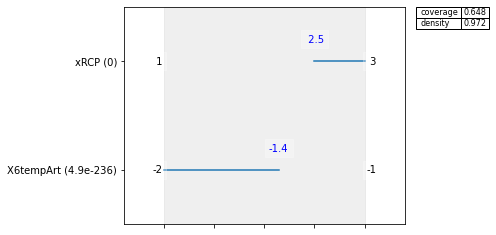

In [53]:
# Saeed : explore the inspect effect
box3.inspect(12)
box3.inspect(12, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


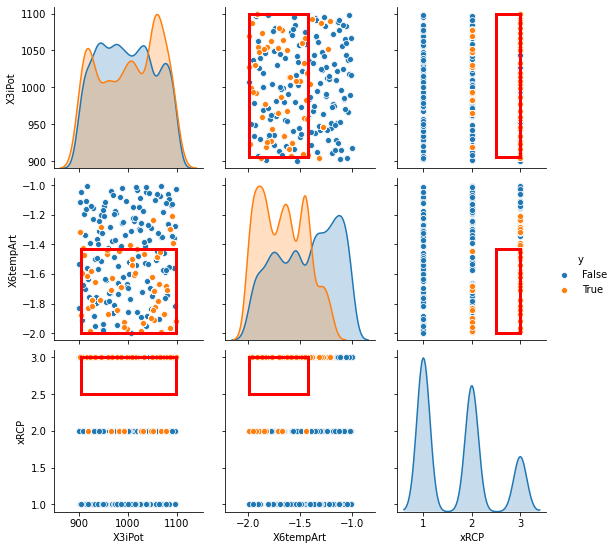

In [55]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(13)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [56]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.5
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1046 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThersh

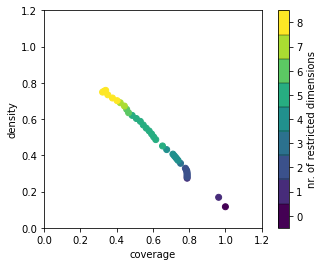

In [57]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage    0.604207
density     0.501587
id                20
mass            0.14
mean        0.501587
res_dim            5
Name: 20, dtype: object

                                                            box 20  \
                                                               min   
X5temp                                                     4.50681   
xRCP                                                           2.5   
xGoodDays                                      {80.0, 90.0, 100.0}   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 220.0}   
policy           {0, 2, 3, 5, 6, 7, 8, 11, 12, 14, 15, 16, 17, ...   

                                                                    \
                                                               max   
X5temp                                                     5.90805   
xRCP                                                             3   
xGoodDays                                      {80.0, 90.0, 100.0}   
x1SnowTh

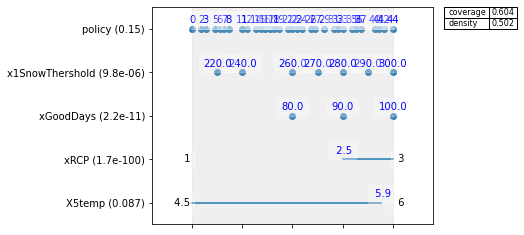

In [58]:
# Saeed : explore the inspect effect
box4.inspect(20)
box4.inspect(20, style='graph')
plt.show()

xGoodDays [100.0, 70.0, 80.0, 90.0, 60.0]
policy [0, 2, 3, 5, 6, 7, 8, 11, 12, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 26, 27, 29, 30, 31, 32, 33, 35, 36, 37, 40, 41, 42, 43, 44, 1, 34, 4, 38, 39, 9, 10, 13, 20, 25, 28]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


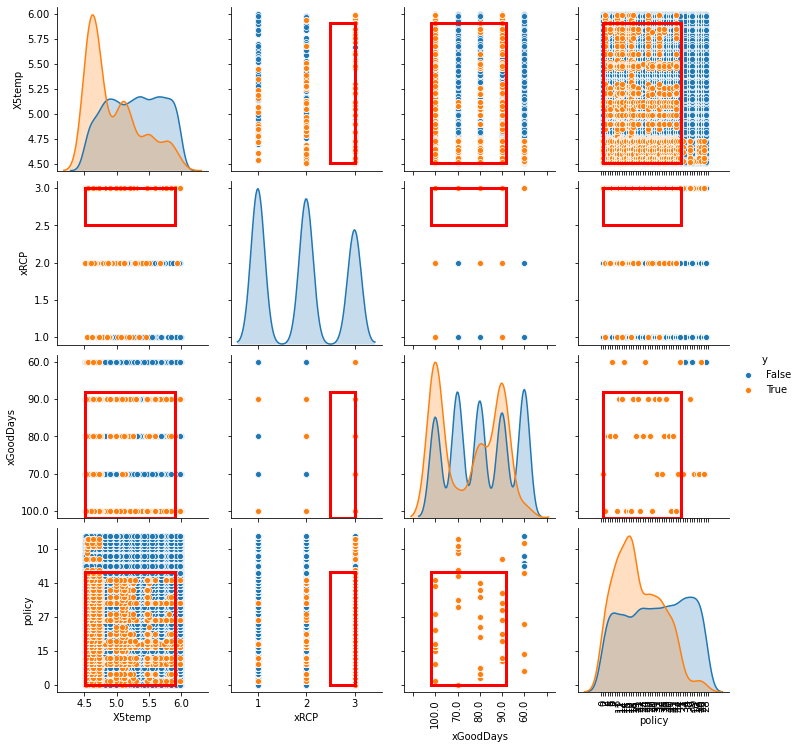

In [59]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(15)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [60]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 4162 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.06666666666666667, coverage: 0.14416146083613648, density: 1.0 restricted_dimensions: 6


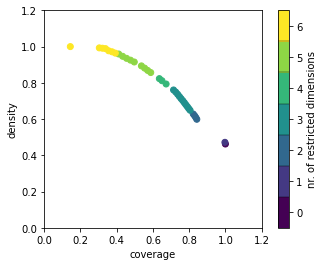

In [61]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.587938
density     0.856793
id                20
mass        0.317333
mean        0.856793
res_dim            5
Name: 20, dtype: object

                                                            box 20  \
                                                               min   
xRCP                                                             1   
policy           {0, 1, 3, 4, 6, 7, 9, 10, 13, 14, 15, 19, 20, ...   
X5temp                                                      4.6719   
xGoodDays                                 {70.0, 80.0, 90.0, 60.0}   
x1SnowThershold  {290.0, 260.0, 200.0, 300.0, 240.0, 280.0, 250...   

                                                                    \
                                                               max   
xRCP                                                           2.5   
policy           {0, 1, 3, 4, 6, 7, 9, 10, 13, 14, 15, 19, 20, ...   
X5temp                                                     5.99366   
xGoodDay

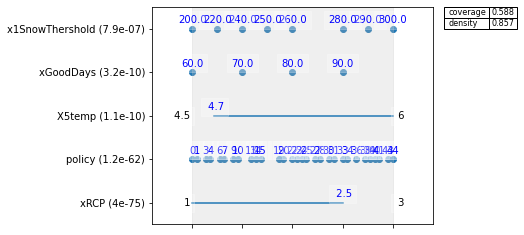

In [62]:
# Saeed : explore the inspect effect
box5.inspect(20)
box5.inspect(20, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 200.0, 300.0, 240.0, 280.0, 250.0, 220.0, 270.0]
xGoodDays [70.0, 80.0, 90.0, 60.0, 100.0]
policy [0, 1, 3, 4, 6, 7, 9, 10, 13, 14, 15, 19, 20, 22, 23, 24, 25, 27, 28, 30, 31, 33, 34, 36, 38, 39, 40, 41, 43, 44, 32, 2, 35, 5, 37, 8, 42, 11, 12, 16, 17, 18, 21, 26, 29]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


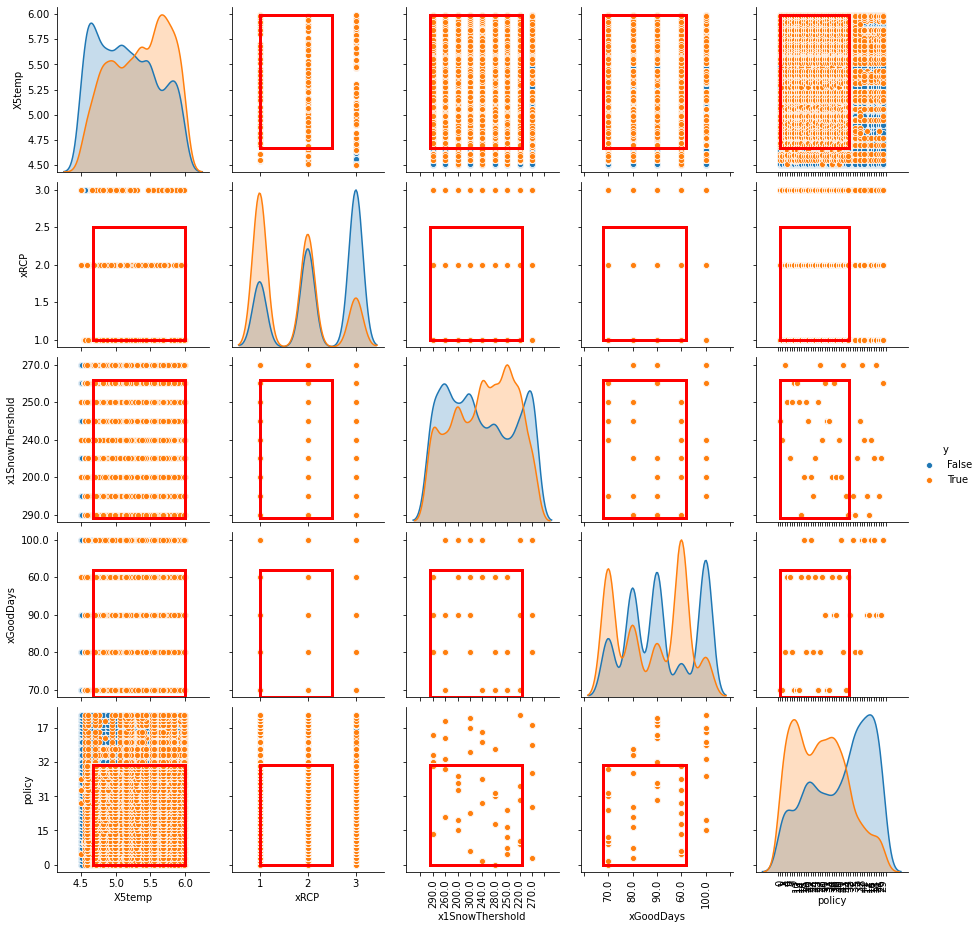

In [63]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(20)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [64]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [65]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [66]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


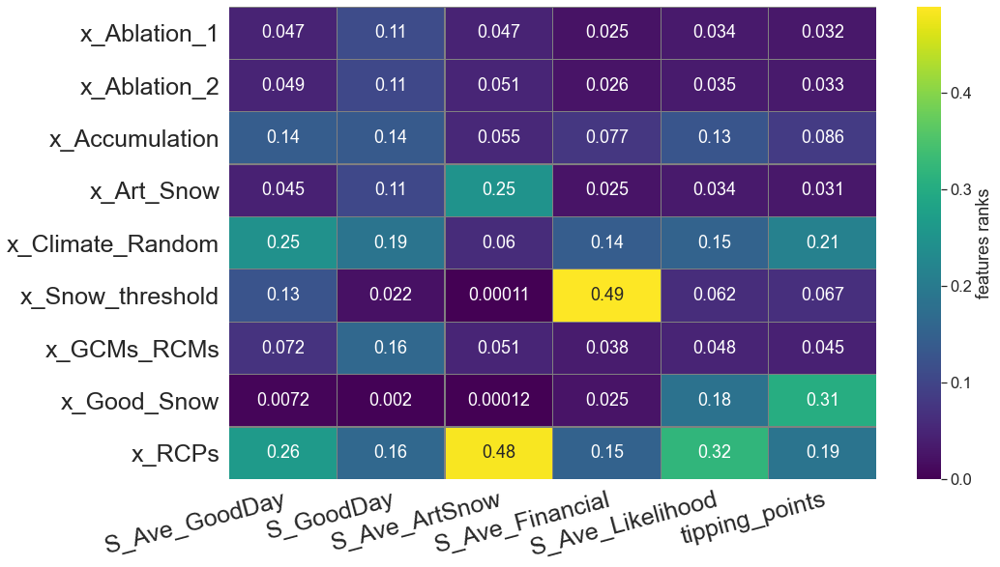

In [67]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


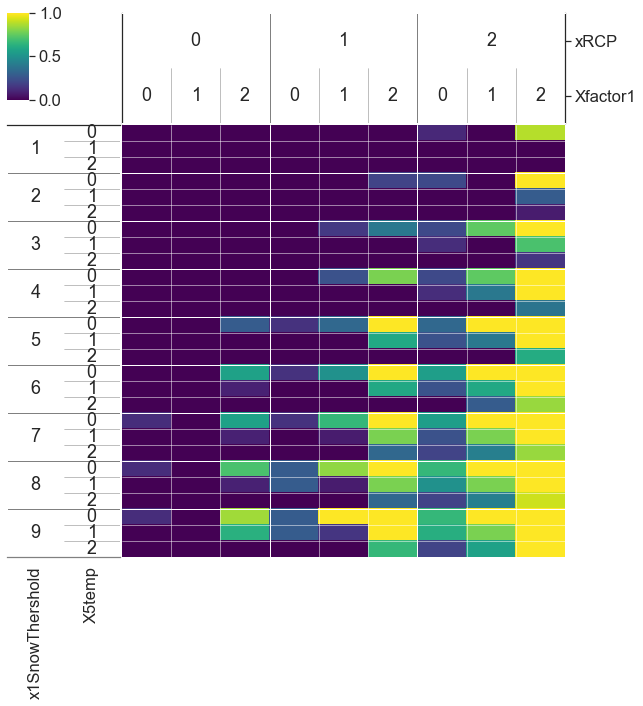

In [68]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 60
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


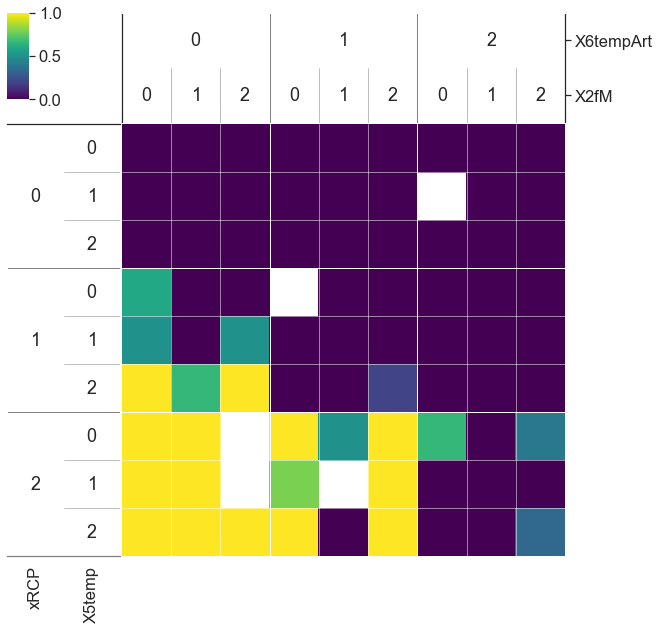

In [69]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 60
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


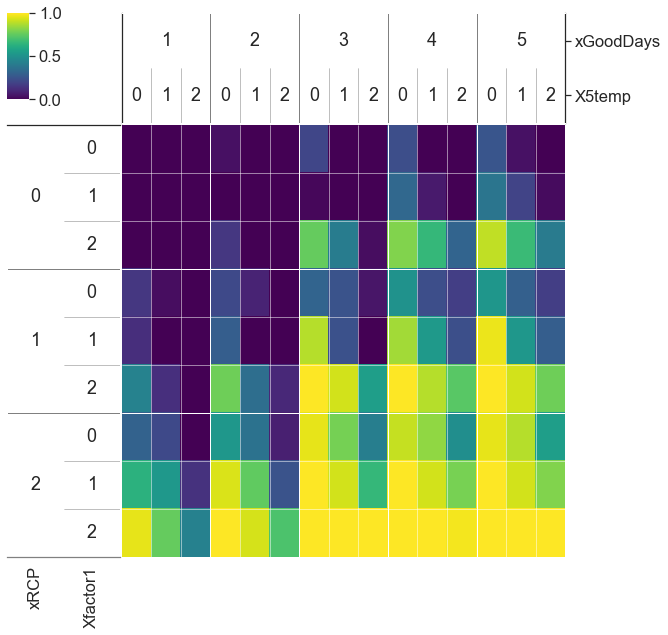

In [70]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

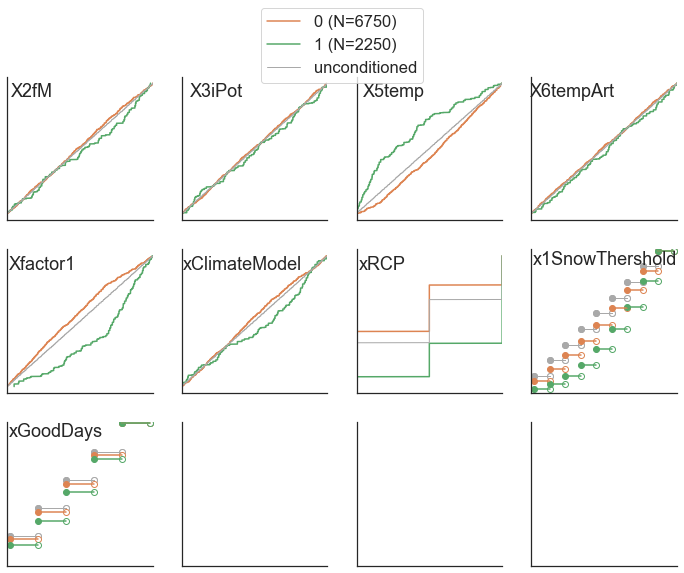

In [71]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

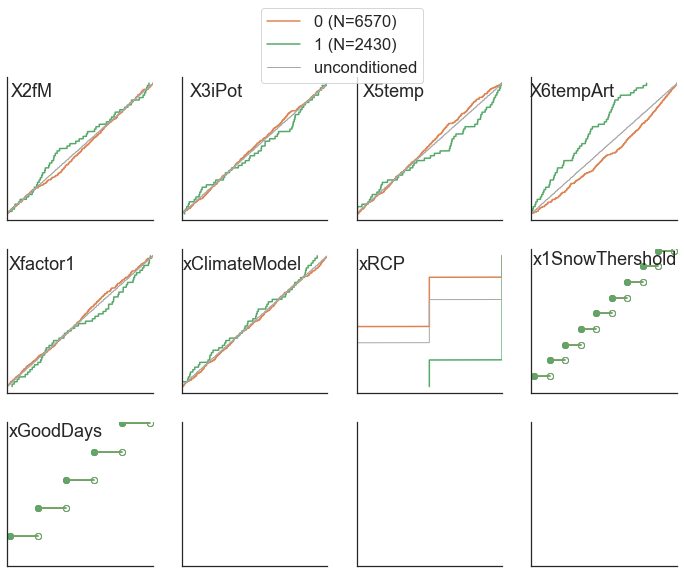

In [72]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 60
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

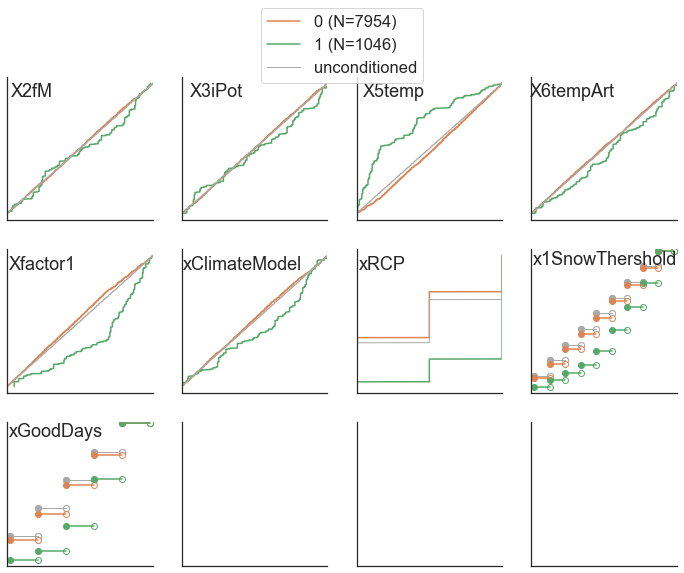

In [73]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

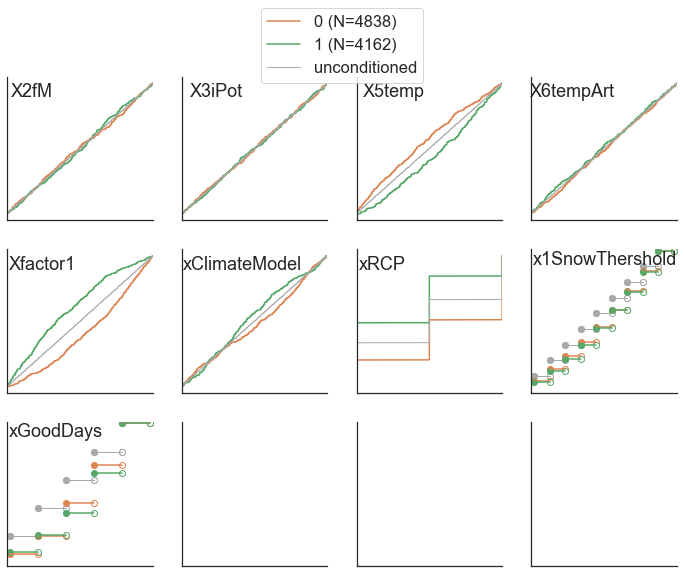

In [74]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

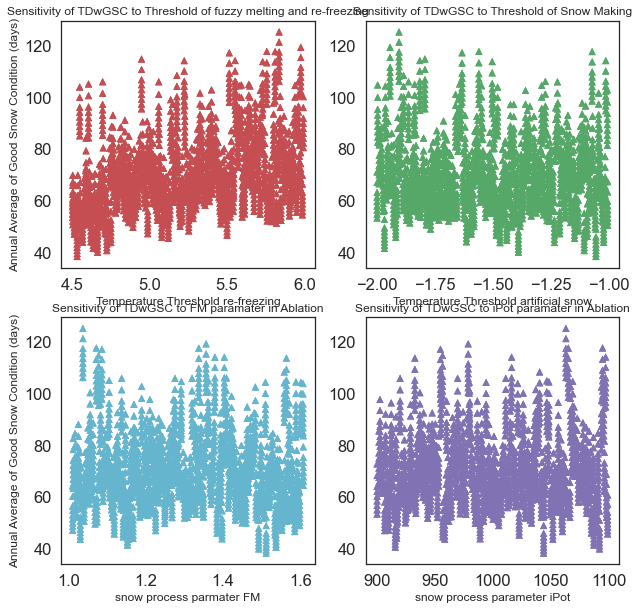

In [75]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

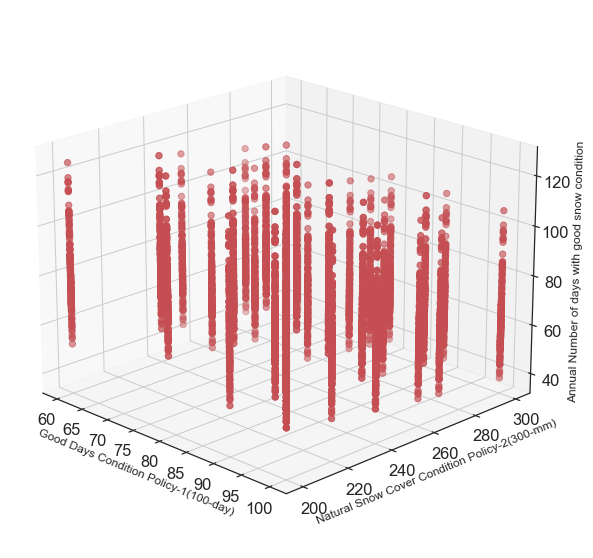

In [76]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [77]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.280125,966.374766,5.184639,-1.039813,1.242465,0.374973,3.0,280.0,70.0,0,0,UZHModel,73.960935,48,75.645036,157.690000,94.293571,70.503250,146.236607,89.329500,137.440357,134.510500,102.111357,32.255464,92.737250,118.818464,82.988429,88.253893,144.858750,119.930393,73.762964,88.762750,42.870571,87.304607,...,25.785214,16.345750,88.790893,54.888929,4.762214,67.200214,58.630071,93.762321,15.226107,8.636571,18.418143,23.633429,10.794000,106.698714,17.580429,61.595357,71.650679,8.407071,50.052036,5.769643,52.325607,7.320643,1.991750,51.452607,7.657179,91.347643,29.805964,33.536179,9.508893,9.942286,60.713983,2.847119,0.638726,10.0
1,1.541020,928.513753,5.881729,-1.156852,2.324987,0.669910,3.0,280.0,70.0,1,0,UZHModel,67.546979,57,110.174286,87.724107,156.705429,72.402464,131.767429,120.549786,72.259250,104.314036,130.872464,117.584179,126.196107,92.382464,71.299929,177.088500,107.840250,121.971429,126.946036,124.285571,118.757286,95.929786,...,16.774000,41.666536,16.462714,32.495250,23.050286,15.670964,61.855107,49.004429,13.861571,30.115679,70.056143,16.226000,10.629643,13.091321,11.404000,43.563357,10.913571,15.540821,67.221571,53.649214,26.501536,2.156286,12.309679,46.716714,35.754000,7.730071,32.523643,12.677000,6.207429,8.169964,63.961271,2.597373,0.631915,17.0
2,1.061103,931.486859,5.353891,-1.800889,2.741733,0.884879,1.0,280.0,70.0,2,0,UZHModel,62.242082,10,94.105321,53.936714,28.598964,54.906321,98.319714,84.025536,130.471429,109.338643,104.208214,63.540500,81.910357,101.876464,131.732536,107.653643,60.631821,97.707321,114.748286,111.562857,42.327750,66.865357,...,23.276500,26.441429,55.539607,41.851929,48.785714,108.493679,106.142036,42.388286,32.492179,31.072321,34.107571,26.162500,54.323536,28.768964,61.834393,32.192786,37.436393,7.258643,17.496571,50.479250,19.408143,11.167286,71.070714,38.156107,106.857500,22.405750,38.735429,33.559929,16.528643,43.253321,66.289322,2.355424,0.635062,17.0
3,1.590828,1018.496944,5.248490,-1.034257,1.607127,0.102415,2.0,280.0,70.0,3,0,UZHModel,62.621791,14,33.851393,23.153286,98.400929,68.054786,65.541857,89.851250,142.073857,133.641429,113.549071,111.044821,107.578071,41.487464,100.735821,117.835643,61.269214,91.489964,68.438893,59.240214,37.753786,50.402571,...,22.782357,131.757071,9.839571,97.994250,53.012214,25.702607,31.758893,54.814286,58.905714,21.087179,75.238464,26.464357,84.034679,124.832214,8.364857,69.882893,57.183214,85.443679,53.765750,21.027607,8.718536,69.188750,58.197964,38.986964,10.170643,96.183714,51.763714,4.991893,70.761643,100.798679,72.596271,2.370424,0.631841,14.0
4,1.156649,1051.926972,4.753099,-1.233790,2.793135,0.776850,3.0,280.0,70.0,4,0,UZHModel,46.345783,60,78.485929,96.116679,128.959286,42.972393,64.635321,83.929500,69.480000,103.928000,113.983821,95.126250,44.293571,98.843429,84.903250,103.324143,57.082964,87.696036,72.270179,110.422143,77.968857,84.824286,...,17.680286,30.805750,7.271893,8.222393,7.370143,30.221679,67.147857,32.984179,4.037036,26.075893,9.104786,27.428643,1.695929,49.268571,3.150750,3.154857,2.740929,7.888000,8.395179,45.222536,12.435357,16.945357,10.060393,13.255143,4.717857,27.479000,3.158036,5.834000,18.150250,4.971214,59.112034,1.733983,0.492170,22.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [78]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.379287,1097.434153,5.553648,-1.813428,0.550730,0.175588,1.0,290.0,60.0,195,44,UZHModel,96.624740,2,78.983621,76.732897,152.207793,58.710000,136.578379,107.988828,132.053241,143.234414,125.202552,131.462138,88.925000,105.658586,122.456621,127.194379,150.584138,150.420207,110.082103,57.565000,27.957103,52.047138,...,79.583931,16.591793,77.466552,104.561655,66.595690,129.438621,131.983310,136.980103,107.668207,130.218483,90.329793,101.608414,99.817690,122.905276,82.355172,120.700759,72.571414,158.028345,87.102414,77.933828,139.435000,35.345931,143.892414,108.782483,159.158069,141.949862,105.112448,48.801655,118.202862,111.780069,68.135424,3.646949,0.777874,1.0
8996,1.284767,942.559111,5.322831,-1.239514,1.595858,0.787291,2.0,290.0,60.0,196,44,UZHModel,61.756218,31,97.733172,151.363552,147.217069,40.676793,110.526069,105.876207,94.721000,112.236828,86.761931,72.547034,75.284793,82.967862,87.318448,69.466241,65.957138,134.718966,32.444207,123.092621,83.305517,81.170276,...,12.097931,59.318172,53.426276,40.444138,19.763621,94.227552,92.772069,50.371000,25.573655,81.708138,40.847759,20.284241,25.545483,94.001552,86.318483,71.386276,8.154483,19.770862,85.572586,14.333517,31.508759,20.127241,24.834069,14.130207,21.196517,54.039448,74.348034,7.353931,26.151448,56.391000,70.197288,2.275085,0.658432,13.0
8997,1.568230,903.950049,4.823029,-1.319771,0.878685,0.398841,3.0,290.0,60.0,197,44,UZHModel,65.549353,48,72.106655,153.663552,91.434241,61.538414,143.468138,84.126690,134.008724,129.817897,93.999310,27.064793,87.963793,114.670483,74.989966,84.921517,138.961655,100.642241,55.603517,76.048241,27.236172,81.974000,...,15.834897,13.650586,78.704103,46.349310,4.197862,62.557690,38.617586,74.118345,9.046103,6.723724,13.027862,19.930897,9.520483,95.017241,16.163276,56.040483,59.237448,6.561414,37.946793,4.799379,42.523345,6.910621,1.316310,41.657621,6.430448,85.017862,24.952345,30.525138,4.558621,9.057931,56.642797,2.439407,0.619793,10.0
8998,1.327344,986.708077,5.149355,-1.408800,1.084255,0.615671,1.0,290.0,60.0,198,44,UZHModel,77.540909,7,63.664759,136.136828,62.865966,77.736655,52.742448,86.313345,90.246586,85.458862,86.259103,45.301172,106.689690,94.260793,87.710793,81.478172,90.343000,63.166655,32.989862,77.000138,65.265034,24.796552,...,79.646000,23.132517,55.104448,91.631793,119.867241,111.012862,89.695793,118.239034,31.884655,26.086379,141.245172,105.486793,51.507483,37.353000,12.850793,68.883655,89.982483,102.626966,48.364586,65.853483,106.503966,15.161379,101.224034,51.760034,59.283724,112.419552,70.258724,135.068310,109.505931,137.342793,72.660932,2.888305,0.743218,4.0
8999,1.069598,1059.656067,4.895190,-1.058105,2.344300,0.814406,3.0,290.0,60.0,199,44,UZHModel,50.947164,61,82.104483,92.067379,132.854000,116.711448,116.288621,103.788655,135.319241,140.522103,57.378448,69.503448,66.118897,113.762310,97.278103,127.655552,77.516138,107.170966,64.700034,111.039586,24.299069,61.792931,...,32.519862,17.387069,8.239103,51.512103,29.835000,20.915414,13.474207,21.444172,18.973448,6.101207,15.051103,43.768069,9.690000,30.956517,4.989897,11.148897,40.595276,8.243000,0.633000,2.354517,10.261552,4.456172,26.247448,58.330172,4.312034,12.612034,23.531414,20.172241,6.997069,11.843759,62.805932,1.860763,0.566671,19.0


In [79]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [80]:
x_policy[1]

280.0

In [81]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,280.0,70.0,1,0,UZHModel,67.546979,57,110.174286,87.724107,156.705429,72.402464,131.767429,120.549786,72.259250,104.314036,130.872464,117.584179,126.196107,92.382464,71.299929,177.088500,107.840250,121.971429,126.946036,124.285571,118.757286,95.929786,...,16.774000,41.666536,16.462714,32.495250,23.050286,15.670964,61.855107,49.004429,13.861571,30.115679,70.056143,16.226000,10.629643,13.091321,11.404000,43.563357,10.913571,15.540821,67.221571,53.649214,26.501536,2.156286,12.309679,46.716714,35.754000,7.730071,32.523643,12.677000,6.207429,8.169964,63.961271,2.597373,0.631915,17.0
201,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,240.0,70.0,1,1,UZHModel,74.583913,57,121.077500,93.094333,160.866042,83.908875,137.087958,125.755500,84.302458,112.652292,138.721125,125.917208,133.463375,105.279250,80.030083,180.610458,115.655250,126.676958,133.543042,136.666208,128.948792,106.079375,...,19.569667,48.610958,19.206500,37.911125,26.892000,18.282792,70.462458,56.685250,16.171833,35.134958,73.541042,18.930333,12.401250,15.273208,13.304667,50.823917,12.732500,18.130958,71.427417,62.590750,30.918458,2.515667,14.361292,54.502833,41.713000,9.018417,37.944250,14.789833,7.242000,9.531625,63.961271,3.146102,0.663187,12.0
401,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,260.0,100.0,1,2,UZHModel,70.939525,57,115.778885,90.379885,159.294038,77.971885,134.235038,123.520538,77.817654,108.217500,134.960462,122.049154,129.610577,98.681269,75.634808,179.380038,111.640885,124.255731,130.347423,130.243769,123.890577,100.725192,...,18.064308,44.871654,17.729077,34.994885,24.823385,16.876423,66.228846,52.716731,14.927846,32.432269,72.035423,17.474154,11.447308,14.098346,12.281231,46.914385,11.753077,16.736269,69.622962,57.776077,28.540115,2.322154,13.256577,50.310308,38.504308,8.324692,35.025462,13.652154,6.684923,8.798423,63.961271,2.858898,0.549785,24.0
601,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,270.0,80.0,1,3,UZHModel,69.211375,57,113.040111,89.030259,157.990815,75.084037,132.967074,122.116667,74.935519,106.227704,132.978852,119.878333,127.849222,95.446963,73.476222,178.202889,109.731000,123.151074,128.610704,127.216926,121.318333,98.299037,...,17.395259,43.209741,17.072444,33.698778,23.904000,16.251370,64.079889,50.806296,14.374963,31.231074,71.061370,16.826963,11.023333,13.576185,11.826370,45.176815,11.317778,16.116407,68.408556,55.636222,27.483074,2.236148,12.765593,48.446963,37.078222,8.016370,33.728222,13.146519,6.437333,8.472556,63.961271,2.731186,0.607647,17.0
801,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,250.0,60.0,1,4,UZHModel,72.725209,57,118.333080,91.709640,160.269840,81.035680,135.604440,124.660160,80.930360,110.346200,136.794480,124.190920,131.475000,102.001720,77.773440,180.152920,113.608200,125.425960,131.944680,133.373520,126.483240,103.314200,...,18.786880,46.666520,18.438240,36.394680,25.816320,17.551480,68.330720,54.659040,15.524960,33.729560,72.759400,18.173120,11.905200,14.662280,12.772480,48.790960,12.223200,17.405720,70.610320,60.087120,29.681720,2.415040,13.786840,52.322720,40.044480,8.657680,36.426480,14.198240,6.952320,9.150360,63.961271,3.003220,0.683136,10.0
1001,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,300.0,80.0,1,5,UZHModel,64.355601,57,104.363800,84.773067,154.283200,67.575633,129.565433,116.

In [ ]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

#plt.show()

### Defining the Q0.9 and Q0.1 databases

In [84]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[35.71185833]
[53.76868981]
[77.96619545]
[96.99321023]
[115.56022273]
(118, 1)
[1.399]
[2.13]
[3.13]
[4.15]
[5.12]
(118, 1)
[53.015]
[59.4725]
[67.93]
[78.69]
[88.632]
(118, 1)
[45.04755556]
[66.71127974]
[95.93883333]
[100.]
[100.]
(118, 1)


In [85]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [86]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_sc_45_18']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [87]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [88]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [89]:
dfq50_26.head()

,median26
0,82.071222
1,98.724038
2,111.067120
3,85.604207
4,109.493034


In [90]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [91]:
dfAllAverages.head()

,median26,median45,median85
0,82.071222,66.409375,80.490400
1,98.724038,98.438010,102.776760
2,111.067120,113.712509,108.191550
3,85.604207,86.402529,84.610462
4,109.493034,107.984800,116.770720


In [92]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[35.71185833]
[53.76868981]
[77.96619545]
[96.99321023]
[115.56022273]
(118, 1)
*** RCP2.6***
[40.72131034]
[59.44375]
[82.07122222]
[97.93195833]
[116.86007407]
(118, 1)
*** RCP4.5***
[30.36]
[40.02]
[66.409375]
[94.35908333]
[116.28111538]
(118, 1)
*** RCP8.5***
[46.10376923]
[58.74645455]
[80.4904]
[98.0092069]
[113.50016667]
(118, 1)


In [93]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[1.399]
[2.13]
[3.13]
[4.15]
[5.12]
(118, 1)
*** RCP2.6***
[1.62]
[2.43]
[3.24]
[4.22]
[5.2]
(118, 1)
*** RCP4.5***
[1.04]
[1.66]
[2.69]
[3.99]
[5.02]
(118, 1)
*** RCP8.5***
[1.77]
[2.36]
[3.27]
[4.17]
[5.17]
(118, 1)


#### Set the parameters of making figure

In [94]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

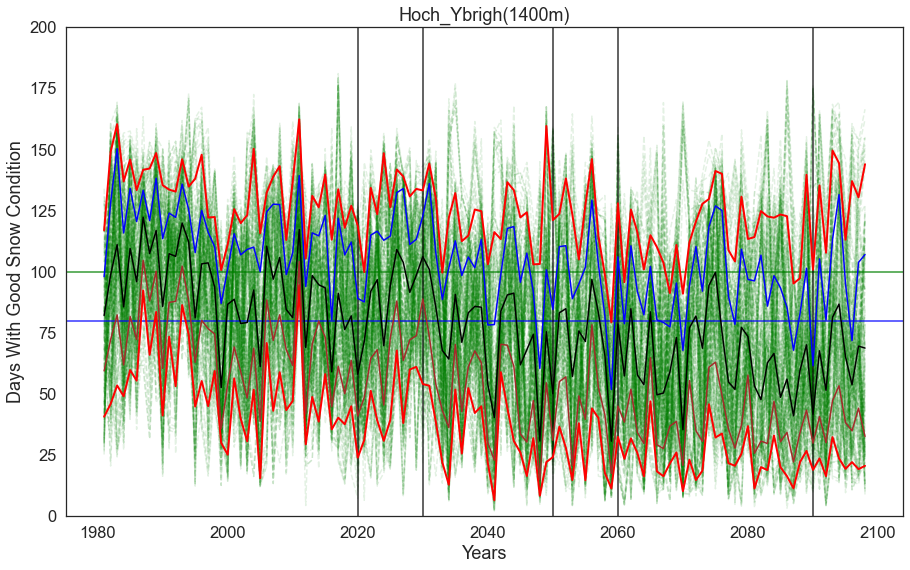

In [95]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

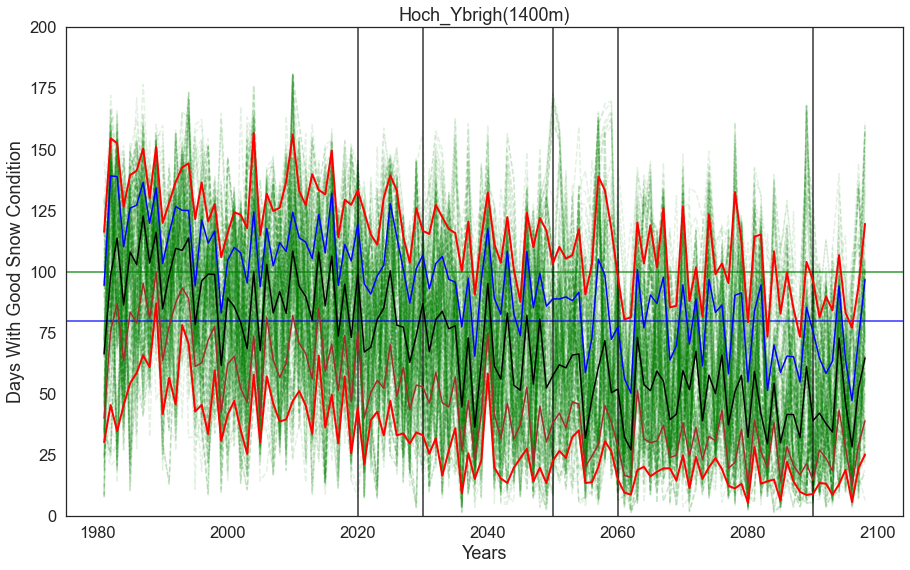

In [96]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

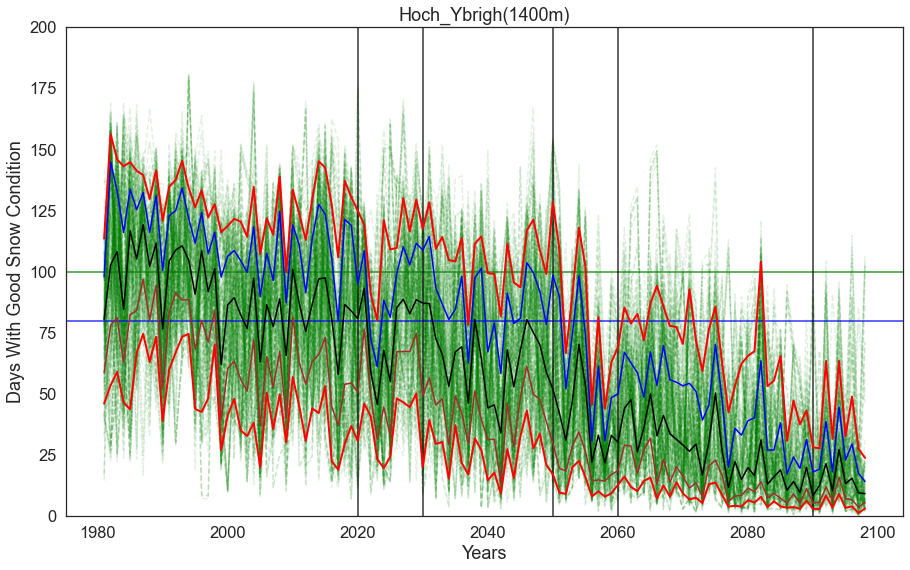

In [97]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [98]:
title_Figs = 'case1, Sattel-Hochstuckli (800-1600m), RCP2.6'

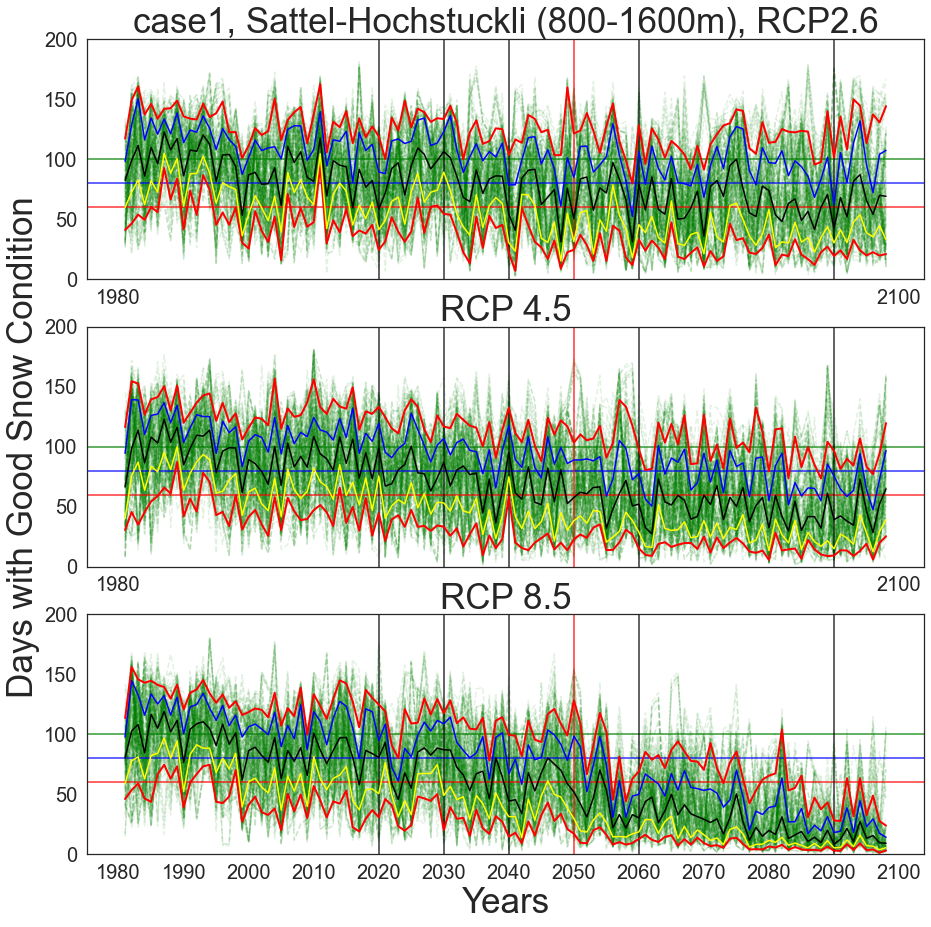

In [99]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

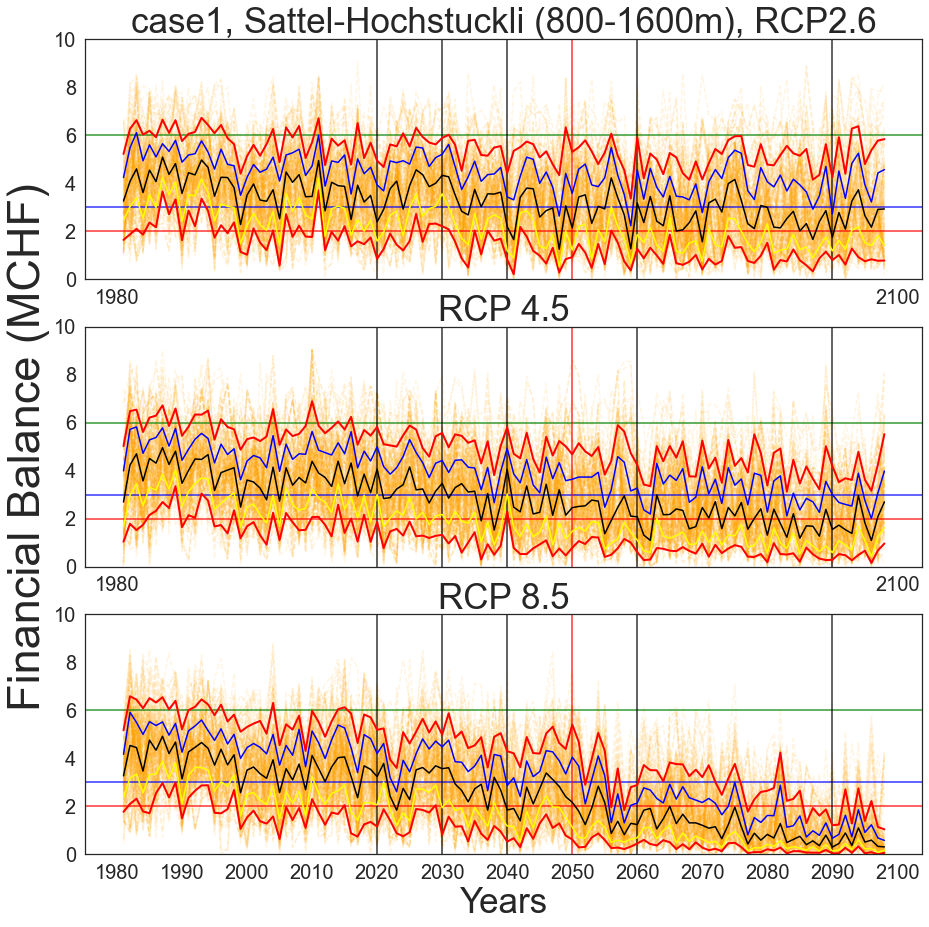

In [100]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

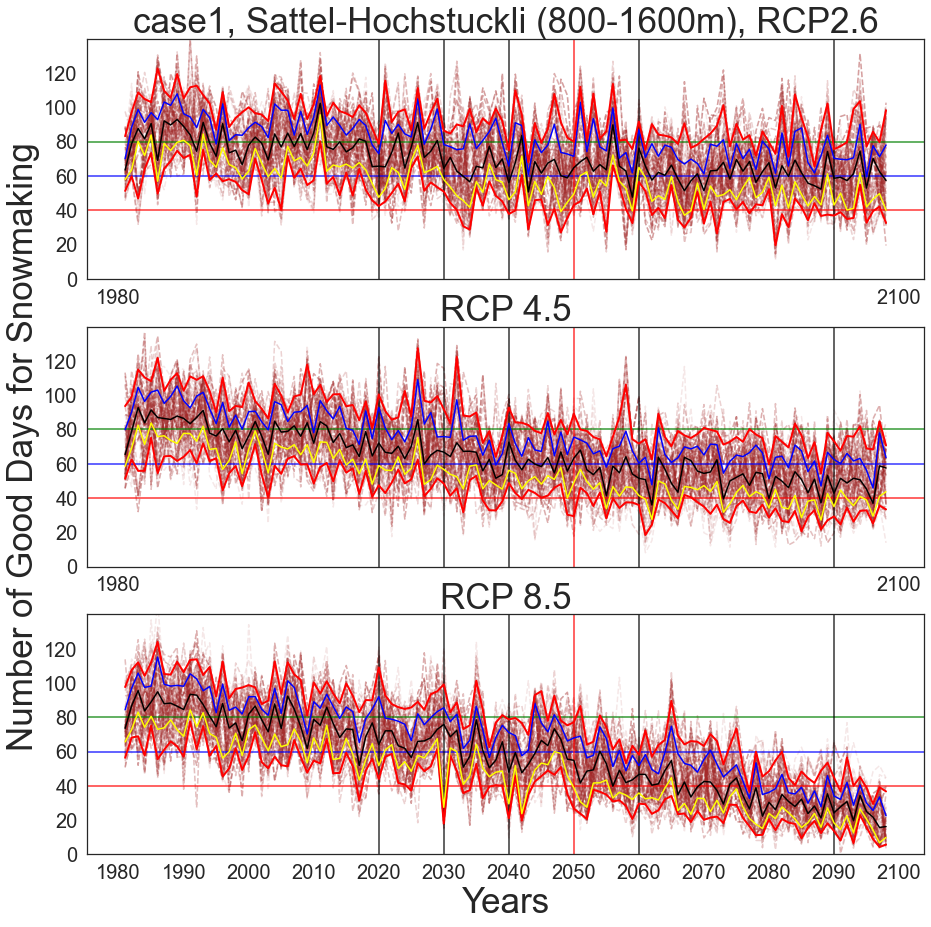

In [101]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

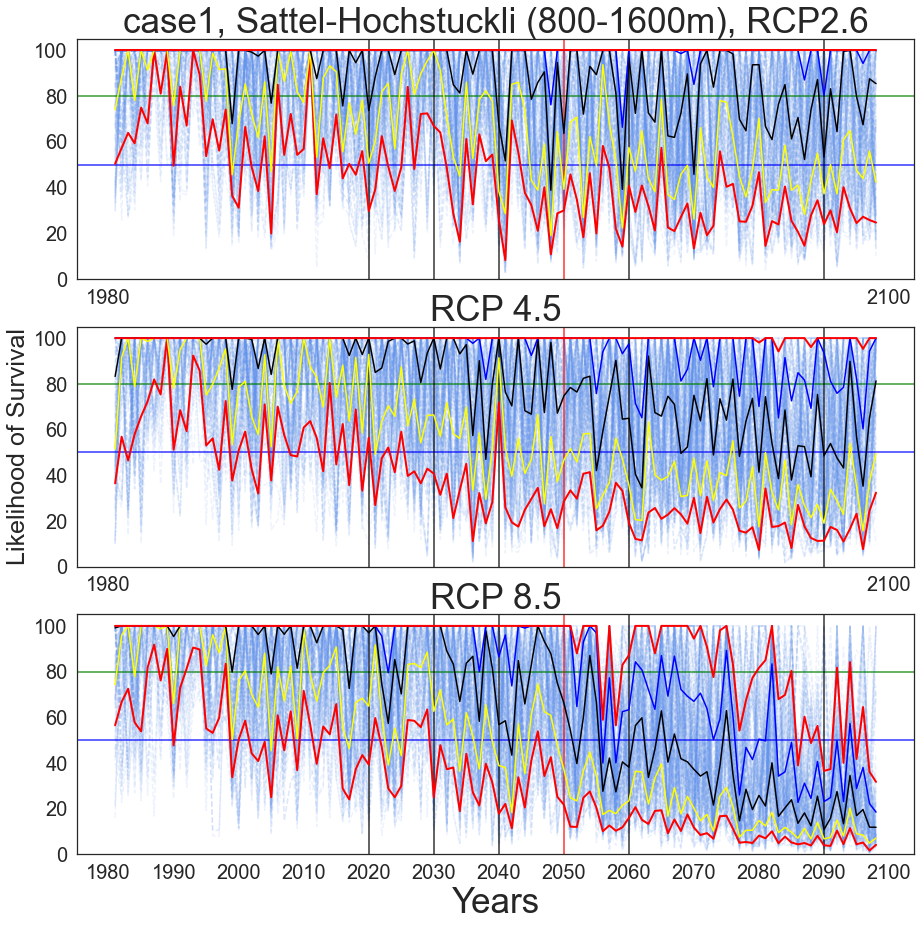

In [102]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [103]:
dfAllAverages.head()

,median26,median45,median85
0,82.071222,66.409375,80.490400
1,98.724038,98.438010,102.776760
2,111.067120,113.712509,108.191550
3,85.604207,86.402529,84.610462
4,109.493034,107.984800,116.770720


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [104]:
title_Figs2 = 'Sattel-Hochstuckli'

In [105]:
y_axis = np.arange(1981, 2100, step= 20)

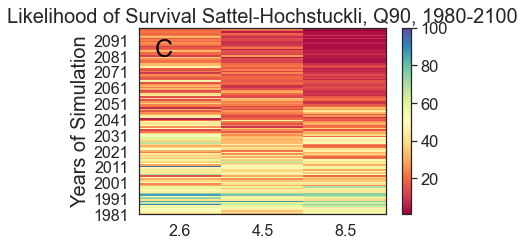

In [106]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'C', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

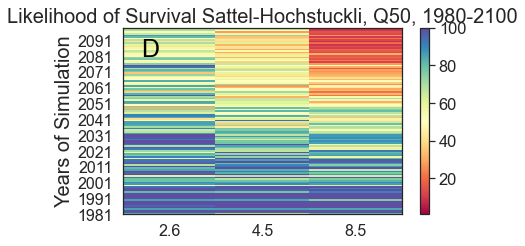

In [107]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'D', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

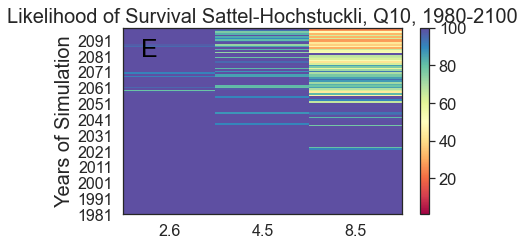

In [108]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'E', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [109]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
(9000, 119, 2)


In [110]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [111]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [112]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [113]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_45_9'], dtype='<U47')

In [114]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [115]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [116]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [117]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [118]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [119]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [120]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_26_5'],sc_2_['Money_sc_26_11'],sc_3_['Money_sc_26_6'],sc_4_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_5_['Money_sc_26_3'],sc_6_['Money_sc_26_5'],sc_7_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_8_['Money_sc_26_5'],sc_9_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_10_['Money_sc_26_1'],sc_11_['Money_sc_26_8'],sc_12_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_13_['Money_sc_26_4'],sc_14_['Money_sc_26_12'],sc_15_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_16_['Money_sc_26_9'],sc_17_['Money_sc_26_11'],sc_18_['Money_sc_26_2'],sc_19_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_20_['Money_sc_26_5'],sc_21_['Money_sc_26_4'],sc_22_['Money_sc_26_12'],sc_23_['Money_sc_26_12'],sc_24_['Money_sc_26_6'],sc_25_['Money_sc_26_8'],sc_26_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_27_['Money_sc_26_5'],sc_28_['Money_sc_26_9'],sc_29_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_30_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_31_['Money_sc_26_10'],sc_32_['Money_sc_26_7'],sc_33_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],...,sc_2982_['Money_sc_26_2'],sc_2983_['Money_sc_26_6'],sc_2984_['Money_sc_26_3'],sc_2985_['Money_sc_26_12'],sc_2986_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2987_['Money_sc_26_10'],sc_2988_['Money_sc_26_6'],sc_2989_['Money_sc_26_7'],sc_2990_['Money_sc_26_4'],sc_2991_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2992_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2993_['Money_sc_26_9'],sc_2994_['Money_sc_26_11'],sc_2995_['Money_sc_26_10'],sc_2996_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2997_['Money_sc_26_8'],sc_2998_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2999_['Money_sc_26_8'],sc_3000_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3001_['Money_sc_26_5'],sc_3002_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3003_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3004_['Money_sc_26_2'],sc_3005_['Money_sc_26_5'],sc_3006_['Money_sc_26_6'],sc_3007_['Money_sc_26_3'],sc_3008_['Money_sc_26_7'],sc_3009_['Money_sc_26_4'],sc_3010_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3011_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3012_['Money_sc_26_11'],sc_3013_['Money_sc_26_8'],sc_3014_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3015_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp']
0,1981-1982,3.2999999999999936,3.0799999999999987,1.6300000000000012,2.8999999999999986,3.039999999999995,1.0200000000000007,3.159999999999995,2.959999999999999,1.8200000000000012,3.029999999999998,4.229999999999998,2.680000000000001,1.9800000000000015,1.7900000000000011,3.129999999999994,1.5100000000000011,2.740000000000002,2.4999999999999973,1.7100000000000013,4.079999999999989,1.6600000000000013,1.4700000000000009,2.7499999999999973,4.01,4.009999999999992,1.1600000000000008,0.9300000000000006,2.9099999999999975,2.6099999999999968,1.450000000000001,1.420000000000001,0.8700000000000006,2.6599999999999957,...,3.840000000000002,5.130000000000005,4.119999999999999,3.919999999999998,2.859999999999998,1.6400000000000012,3.3299999999999965,1.270000000000001,3.3500000000000028,2.820000000000002,2.859999999999998,2.0200000000000014,4.199999999999998,1.1800000000000008,4.149999999999995,5.250000000000004,2.9799999999999938,2.88,3.8200000000000016,4.839999999999996,3.6500000000000004,3.860000000000002,4.040000000000001,4.429999999999998,5.010000000000003,4.119999999999999,1.0100000000000007,3.2100000000000013,3.7100000000000026,2.0500000000000003,3.3300000000000027,2.7500000000000018,3.6900000000000004,3.0900000000000003
1,1982-1983,4.9200000000000035,1.7500000000000013,1.2100000000000009,2.9900000000000015,3.589999999999994,3.459999999999992,5.110000000000004,4.640000000000003,5.48,3.329999999999993,2.25,4.920000000000002,1.5300000000000011,3.2399999999999998,5.260000000000004,3.289999999999995,1.370000000000001,3.999999999999997,3.43,4.680000000000003,1.2400000000000009,3.109999999999999,2.6600000000000015,3.1000000000000014,1.5400000000000011,3.639999999999994,3.6799999999999926,3.990000000000003,4.22999999999

In [121]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [122]:
df45_all_fin.head(7)

,Season,sc_1_['Money_sc_45_18'],sc_2_['Money_sc_45_3'],sc_3_['Money_sc_45_9'],sc_4_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_5_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_6_['Money_sc_45_13'],sc_7_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_8_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_9_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_10_['Money_sc_45_21'],sc_11_['Money_sc_45_23'],sc_12_['Money_sc_45_17'],sc_13_['Money_sc_45_22'],sc_14_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_15_['Money_sc_45_10'],sc_16_['Money_sc_45_18'],sc_17_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_19_['Money_sc_45_21'],sc_20_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_21_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_22_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_23_['Money_sc_45_4'],sc_24_['Money_sc_45_6'],sc_25_['Money_sc_45_1'],sc_26_['Money_sc_45_21'],sc_27_['Money_sc_45_5'],sc_28_['Money_sc_45_1'],sc_29_['Money_sc_45_19'],sc_30_['Money_sc_45_5'],sc_31_['Money_sc_45_22'],sc_32_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_33_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],...,sc_2937_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_2938_['Money_sc_45_20'],sc_2939_['Money_sc_45_9'],sc_2940_['Money_sc_45_18'],sc_2941_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2942_['Money_sc_45_4'],sc_2943_['Money_sc_45_1'],sc_2944_['Money_sc_45_18'],sc_2945_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2946_['Money_sc_45_2'],sc_2947_['Money_sc_45_12'],sc_2948_['Money_sc_45_13'],sc_2949_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2950_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2951_['Money_sc_45_11'],sc_2952_['Money_sc_45_13'],sc_2953_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2954_['Money_sc_45_3'],sc_2955_['Money_sc_45_7'],sc_2956_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2957_['Money_sc_45_25'],sc_2958_['Money_sc_45_7'],sc_2959_['Money_sc_45_17'],sc_2960_['Money_sc_45_13'],sc_2961_['Money_sc_45_12'],sc_2962_['Money_sc_45_3'],sc_2963_['Money_sc_45_16'],sc_2964_['Money_sc_45_24'],sc_2965_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_2966_['Money_sc_45_3'],sc_2967_['Money_sc_45_8'],sc_2968_['Money_sc_45_17'],sc_2969_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_2970_['Money_sc_45_20']
0,1981-1982,2.6599999999999984,0.9800000000000006,0.5700000000000003,0.8900000000000005,2.1200000000000006,1.330000000000001,2.660000000000001,2.4599999999999986,1.6300000000000012,3.049999999999995,1.8000000000000014,3.1700000000000026,1.8400000000000014,4.390000000000003,4.149999999999997,2.270000000000002,1.7300000000000013,2.0400000000000005,4.149999999999996,3.739999999999996,1.500000000000001,2.2099999999999995,2.919999999999998,2.3199999999999994,0.9500000000000006,4.159999999999996,0.9700000000000006,0.9600000000000006,3.680000000000001,1.280000000000001,0.6200000000000003,1.8600000000000014,3.789999999999995,...,2.829999999999997,3.6699999999999964,0.6800000000000004,3.429999999999999,2.8199999999999967,3.530000000000002,1.1000000000000008,3.910000000000002,2.7799999999999967,0.20000000000000004,4.340000000000002,1.6000000000000012,4.380000000000004,0.9400000000000006,5.120000000000004,2.1399999999999983,2.25,2.3700000000000014,2.519999999999999,3.1100000000000025,4.330000000000001,3.3299999999999974,3.9900000000000024,3.390000000000003,4.440000000000001,1.5100000000000011,1.5400000000000011,3.999999999999998,2.1299999999999994,1.490000000000001,1.4500000000000008,1.9400000000000015,3.8300000000000005,4.750000000000008
1,1982-1983,5.3100000000000005,0.6100000000000003,6.000000000000009,5.950000000000005,2.62,2.459999999999999,4.850000000000001,2.31,5.339999999999998,2.6700000000000004,4.650000000000003,2.7899999999999965,1.7000000000000013,3.4300000000000024,2.4299999999999993,4.319999999999991,1.5500000000000012,5.060000000000003,3.0199999999999987,2.7799999999999967,3.4500000000000006,2.6500000000000004,2.600000000000002,2.0400000000000005,2.0000000000000013,3.009999999999999,0.7200000

In [123]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [124]:
df85_all_fin.head(7)

,Season,sc_1_['Money_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_2_['Money_sc_85_21'],sc_3_['Money_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_4_['Money_sc_85_21'],sc_5_['Money_sc_85_24'],sc_6_['Money_sc_85_3'],sc_7_['Money_sc_85_10'],sc_8_['Money_sc_85_13'],sc_9_['Money_sc_85_9'],sc_10_['Money_sc_85_1'],sc_11_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_12_['Money_sc_85_19'],sc_13_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_14_['Money_sc_85_18'],sc_15_['Money_sc_85_26'],sc_16_['Money_sc_85_21'],sc_17_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_18_['Money_sc_85_9'],sc_19_['Money_sc_85_21'],sc_20_['Money_sc_85_29'],sc_21_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_22_['Money_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_23_['Money_sc_85_7'],sc_24_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_25_['Money_sc_85_6'],sc_26_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_27_['Money_sc_85_25'],sc_28_['Money_sc_85_18'],sc_29_['Money_sc_85_26'],sc_30_['Money_sc_85_23'],sc_31_['Money_sc_85_20'],sc_32_['Money_sc_85_1'],sc_33_['Money_sc_85_4'],...,sc_2982_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2983_['Money_sc_85_28'],sc_2984_['Money_sc_85_26'],sc_2985_['Money_sc_85_17'],sc_2986_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_2987_['Money_sc_85_20'],sc_2988_['Money_sc_85_12'],sc_2989_['Money_sc_85_22'],sc_2990_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2991_['Money_sc_85_30'],sc_2992_['Money_sc_85_28'],sc_2993_['Money_sc_85_21'],sc_2994_['Money_sc_85_8'],sc_2995_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2996_['Money_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_2997_['Money_sc_85_1'],sc_2998_['Money_sc_85_18'],sc_2999_['Money_sc_85_24'],sc_3000_['Money_sc_85_1'],sc_3001_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_3002_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_3003_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_3004_['Money_sc_85_18'],sc_3005_['Money_sc_85_3'],sc_3006_['Money_sc_85_15'],sc_3007_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3008_['Money_sc_85_8'],sc_3009_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_3010_['Money_sc_85_22'],sc_3011_['Money_sc_85_26'],sc_3012_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_3013_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3014_['Money_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_3015_['Money_sc_85_25']
0,1981-1982,2.8599999999999994,4.239999999999999,2.2900000000000005,3.759999999999997,2.679999999999996,1.9300000000000015,1.0900000000000007,2.899999999999998,2.199999999999999,2.5799999999999996,1.490000000000001,3.449999999999992,1.7000000000000013,2.250000000000001,2.2499999999999996,3.4199999999999955,2.3999999999999977,3.439999999999997,2.2699999999999987,3.009999999999996,2.6599999999999975,3.9400000000000004,3.9600000000000004,2.660000000000001,5.010000000000004,1.470000000000001,1.7500000000000013,1.8800000000000014,1.5600000000000012,2.389999999999999,2.0799999999999996,2.8099999999999987,2.609999999999997,...,4.660000000000001,2.4999999999999964,3.0900000000000003,5.2500000000000036,3.9700000000000033,3.8700000000000014,1.440000000000001,4.090000000000001,3.9,4.050000000000002,5.3700000000000045,4.570000000000002,1.9200000000000015,3.0000000000000004,2.66,0.6700000000000004,3.6899999999999986,3.4999999999999996,3.589999999999998,3.6399999999999997,2.340000000000001,3.760000000000003,3.7499999999999987,2.6799999999999966,2.61,4.089999999999997,1.9600000000000015,2.060000000000001,1.6900000000000013,1.8700000000000014,3.980000000000003,2.19,3.5400000000000005,4.070000000000001
1,1982-1983,6.340000000000006,3.400000000000002,5.790000000000008,3.160000000000002,3.2800000000000002,2.499999999999999,1.9800000000000015,4.510000000000003,2.46,5.860000000000005,5.05000000000001,1.5800000000000012,5.479999999999996,1.8800000000000014,2.849999999999996,3.1200000000000014,2.9599999999999995,2.6199999999999974,2.5499999999999976,3.2699999999999974,4.610000000000001,1.5600000000000012,4.289999999999996,5.100000000000001,3.9500000000000024,5.060000000000009,5.590000000000004,1.740000000

In [125]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [126]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_26_5'],sc_2_['ArtSnowPossibility_sc_26_11'],sc_3_['ArtSnowPossibility_sc_26_6'],sc_4_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_5_['ArtSnowPossibility_sc_26_3'],sc_6_['ArtSnowPossibility_sc_26_5'],sc_7_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_8_['ArtSnowPossibility_sc_26_5'],sc_9_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_10_['ArtSnowPossibility_sc_26_1'],sc_11_['ArtSnowPossibility_sc_26_8'],sc_12_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_13_['ArtSnowPossibility_sc_26_4'],sc_14_['ArtSnowPossibility_sc_26_12'],sc_15_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_16_['ArtSnowPossibility_sc_26_9'],sc_17_['ArtSnowPossibility_sc_26_11'],sc_18_['ArtSnowPossibility_sc_26_2'],sc_19_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_20_['ArtSnowPossibility_sc_26_5'],sc_21_['ArtSnowPossibility_sc_26_4'],sc_22_['ArtSnowPossibility_sc_26_12'],sc_23_['ArtSnowPossibility_sc_26_12'],sc_24_['ArtSnowPossibility_sc_26_6'],sc_25_['ArtSnowPossibility_sc_26_8'],sc_26_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_27_['ArtSnowPossibility_sc_26_5'],sc_28_['ArtSnowPossibility_sc_26_9'],sc_29_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_30_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_31_['ArtSnowPossibility_sc_26_10'],sc_32_['ArtSnowPossibility_sc_26_7'],sc_33_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],...,sc_2982_['ArtSnowPossibility_sc_26_2'],sc_2983_['ArtSnowPossibility_sc_26_6'],sc_2984_['ArtSnowPossibility_sc_26_3'],sc_2985_['ArtSnowPossibility_sc_26_12'],sc_2986_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2987_['ArtSnowPossibility_sc_26_10'],sc_2988_['ArtSnowPossibility_sc_26_6'],sc_2989_['ArtSnowPossibility_sc_26_7'],sc_2990_['ArtSnowPossibility_sc_26_4'],sc_2991_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2992_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2993_['ArtSnowPossibility_sc_26_9'],sc_2994_['ArtSnowPossibility_sc_26_11'],sc_2995_['ArtSnowPossibility_sc_26_10'],sc_2996_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2997_['ArtSnowPossibility_sc_26_8'],sc_2998_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2999_['ArtSnowPossibility_sc_26_8'],sc_3000_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3001_['ArtSnowPossibility_sc_26_5'],sc_3002_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3003_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3004_['ArtSnowPossibility_sc_26_2'],sc_3005_['ArtSnowPossibility_sc_26_5'],sc_3006_['ArtSnowPossibility_sc_26_6'],sc_3007_['ArtSnowPossibility_sc_26_3'],sc_3008_['ArtSnowPossibility_sc_26_7'],sc_3009_['ArtSnowPossibility_sc_26_4'],sc_3010_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3011_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3012_['ArtSnowPossibility_sc_26_11'],sc_3013_['ArtSnowPossibility_sc_26_8'],sc_3014_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3015_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp']
0,1981-1982,58.74000000000001,65.10999999999999,57.890000000000015,78.69000000000003,60.82999999999999,47.089999999999996,60.3,58.74000000000001,59.56999999999999,62.99,71.72,68.52999999999999,70.07000000000001,73.59,67.67999999999999,59.449999999999996,87.75,69.14,66.38000000000001,57.32,61.75999999999999,78.83,57.21000000000001,97.63,61.42999999999999,51.27,47.86,77.82999999999998,56.720000000000006,69.58,55.29999999999998,52.33,60.3,...,57.96,88.74,58.11,65.57,63.37999999999999,55.29999999999998,50.75000000000001,47.78999999999999,81.17999999999998,46.919999999999995,63.559999999999995,61.23,65.83999999999999,60.96,63.470000000000006,69.45,59.48,68.32000000000001,68.19999999999999,62.32000000000001,63.720000000000006,62.75,74.97000000000001,56.61,88.03999999999999,56.129999999999995,52.33,83.17999999999999,45.56000000000001,54.779999999999994,89.0

In [127]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [128]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_45_18'],sc_2_['ArtSnowPossibility_sc_45_3'],sc_3_['ArtSnowPossibility_sc_45_9'],sc_4_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_5_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_6_['ArtSnowPossibility_sc_45_13'],sc_7_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_8_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_9_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_10_['ArtSnowPossibility_sc_45_21'],sc_11_['ArtSnowPossibility_sc_45_23'],sc_12_['ArtSnowPossibility_sc_45_17'],sc_13_['ArtSnowPossibility_sc_45_22'],sc_14_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_15_['ArtSnowPossibility_sc_45_10'],sc_16_['ArtSnowPossibility_sc_45_18'],sc_17_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_19_['ArtSnowPossibility_sc_45_21'],sc_20_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_21_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_22_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_23_['ArtSnowPossibility_sc_45_4'],sc_24_['ArtSnowPossibility_sc_45_6'],sc_25_['ArtSnowPossibility_sc_45_1'],sc_26_['ArtSnowPossibility_sc_45_21'],sc_27_['ArtSnowPossibility_sc_45_5'],sc_28_['ArtSnowPossibility_sc_45_1'],sc_29_['ArtSnowPossibility_sc_45_19'],sc_30_['ArtSnowPossibility_sc_45_5'],sc_31_['ArtSnowPossibility_sc_45_22'],sc_32_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_33_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],...,sc_2937_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_2938_['ArtSnowPossibility_sc_45_20'],sc_2939_['ArtSnowPossibility_sc_45_9'],sc_2940_['ArtSnowPossibility_sc_45_18'],sc_2941_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2942_['ArtSnowPossibility_sc_45_4'],sc_2943_['ArtSnowPossibility_sc_45_1'],sc_2944_['ArtSnowPossibility_sc_45_18'],sc_2945_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2946_['ArtSnowPossibility_sc_45_2'],sc_2947_['ArtSnowPossibility_sc_45_12'],sc_2948_['ArtSnowPossibility_sc_45_13'],sc_2949_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2950_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2951_['ArtSnowPossibility_sc_45_11'],sc_2952_['ArtSnowPossibility_sc_45_13'],sc_2953_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2954_['ArtSnowPossibility_sc_45_3'],sc_2955_['ArtSnowPossibility_sc_45_7'],sc_2956_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2957_['ArtSnowPossibility_sc_45_25'],sc_2958_['ArtSnowPossibility_sc_45_7'],sc_2959_['ArtSnowPossibility_sc_45_17'],sc_2960_['ArtSnowPossibility_sc_45_13'],sc_2961_['ArtSnowPossibility_sc_45_12'],sc_2962_['ArtSnowPossibility_sc_45_3'],sc_2963_['ArtSnowPossibility_sc_45_16'],sc_2964_['ArtSnowPossibility_sc_45_24'],sc_2965_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_2966_['ArtSnowPossibility_sc_45_3'],sc_2967_['ArtSnowPossibility_sc_45_8'],sc_2968_['ArtSnowPossibility_sc_45_17'],sc_2969_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_2970_['ArtSnowPossibility_sc_45_20']
0,1981-1982,81.23,64.96,51.18999999999999,53.86000000000001,66.35000000000002,64.77,62.790000000000006,71.84000000000002,61.75000000000001,93.87000000000002,63.63000000000001,88.62,66.78,76.73,77.93,79.96999999999996,56.57000000000001,79.88000000000001,88.49000000000002,113.16000000000001,69.42,65.71,65.07000000000001,65.91999999999997,51.19,98.80000000000003,64.02999999999999,50.120000000000005,74.73,62.730000000000004,58.15000000000001,56.63,111.15,...,64.2,67.2,51.18999999999999,81.23,71.84000000000002,65.07000000000001,50.120000000000005,106.21000000000001,80.2,53.81999999999999,82.31,55.39000000000001,82.66000000000001,64.1,81.94999999999999,60.14000000000001,58.760000000000005,61.67999999999999,65.82,45.599999999999994,77.71999999999998,71.97,84.18999999999997,106.34,93.66,58.56000000000001,60.43,61.26,71.01999999999997,53.78,45.5899999

In [129]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [130]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_2_['ArtSnowPossibility_sc_85_21'],sc_3_['ArtSnowPossibility_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_4_['ArtSnowPossibility_sc_85_21'],sc_5_['ArtSnowPossibility_sc_85_24'],sc_6_['ArtSnowPossibility_sc_85_3'],sc_7_['ArtSnowPossibility_sc_85_10'],sc_8_['ArtSnowPossibility_sc_85_13'],sc_9_['ArtSnowPossibility_sc_85_9'],sc_10_['ArtSnowPossibility_sc_85_1'],sc_11_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_12_['ArtSnowPossibility_sc_85_19'],sc_13_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_14_['ArtSnowPossibility_sc_85_18'],sc_15_['ArtSnowPossibility_sc_85_26'],sc_16_['ArtSnowPossibility_sc_85_21'],sc_17_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_18_['ArtSnowPossibility_sc_85_9'],sc_19_['ArtSnowPossibility_sc_85_21'],sc_20_['ArtSnowPossibility_sc_85_29'],sc_21_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_22_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_23_['ArtSnowPossibility_sc_85_7'],sc_24_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_25_['ArtSnowPossibility_sc_85_6'],sc_26_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_27_['ArtSnowPossibility_sc_85_25'],sc_28_['ArtSnowPossibility_sc_85_18'],sc_29_['ArtSnowPossibility_sc_85_26'],sc_30_['ArtSnowPossibility_sc_85_23'],sc_31_['ArtSnowPossibility_sc_85_20'],sc_32_['ArtSnowPossibility_sc_85_1'],sc_33_['ArtSnowPossibility_sc_85_4'],...,sc_2982_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2983_['ArtSnowPossibility_sc_85_28'],sc_2984_['ArtSnowPossibility_sc_85_26'],sc_2985_['ArtSnowPossibility_sc_85_17'],sc_2986_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_2987_['ArtSnowPossibility_sc_85_20'],sc_2988_['ArtSnowPossibility_sc_85_12'],sc_2989_['ArtSnowPossibility_sc_85_22'],sc_2990_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2991_['ArtSnowPossibility_sc_85_30'],sc_2992_['ArtSnowPossibility_sc_85_28'],sc_2993_['ArtSnowPossibility_sc_85_21'],sc_2994_['ArtSnowPossibility_sc_85_8'],sc_2995_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2996_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_2997_['ArtSnowPossibility_sc_85_1'],sc_2998_['ArtSnowPossibility_sc_85_18'],sc_2999_['ArtSnowPossibility_sc_85_24'],sc_3000_['ArtSnowPossibility_sc_85_1'],sc_3001_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_3002_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_3003_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_3004_['ArtSnowPossibility_sc_85_18'],sc_3005_['ArtSnowPossibility_sc_85_3'],sc_3006_['ArtSnowPossibility_sc_85_15'],sc_3007_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3008_['ArtSnowPossibility_sc_85_8'],sc_3009_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_3010_['ArtSnowPossibility_sc_85_22'],sc_3011_['ArtSnowPossibility_sc_85_26'],sc_3012_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_3013_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3014_['ArtSnowPossibility_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_3015_['ArtSnowPossibility_sc_85_25']
0,1981-1982,99.51,86.30999999999999,99.51,86.30999999999999,72.99000000000001,75.36000000000001,66.17,71.69000000000003,51.54000000000003,70.18999999999998,69.19,88.06000000000002,69.00999999999999,113.94999999999999,97.63000000000001,81.65999999999997,74.45000000000002,101.93,63.050000000000004,119.07000000000001,74.27,84.37999999999998,81.18999999999998,65.31000000000003,69.21,73.86999999999999,73.52,113.50999999999999,74.62,78.93,64.1,68.18,54.48,...,83.47,50.67,92.49000000000002,89.31,70.18000000000002,73.66999999999999,56.03000000000001,57.200000000000024,73.85,71.07,57.419999999999995,84.41000000000001,87.35,81.98,84.52000000000001,56.349999999999994,62.470000000000006,63.44000000000001,76.76,71.35,65.63000000000001,72.55000000000001,70.03000000000002,85.83000000000001,52.790000000000006,58.72000000000002,76.00999999999998

### Survival Map CH2018 RCP2.6

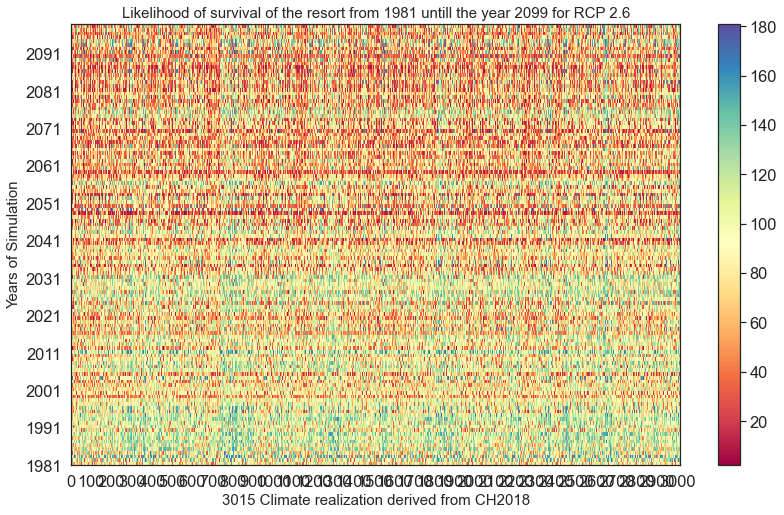

In [131]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

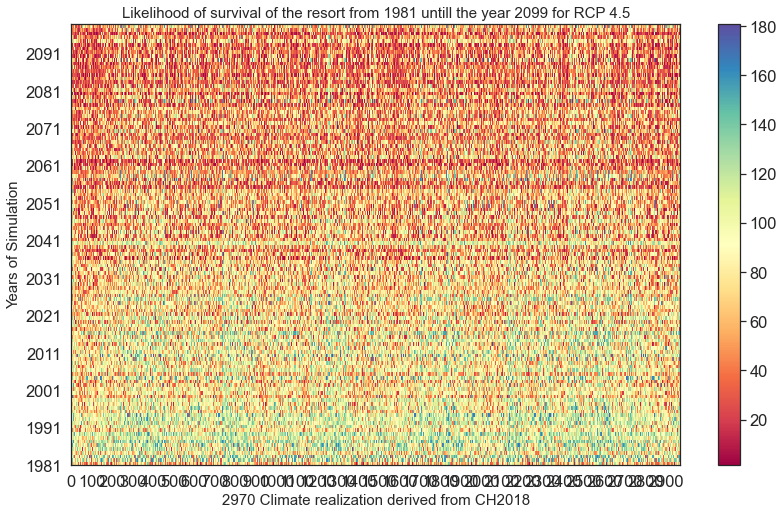

In [132]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

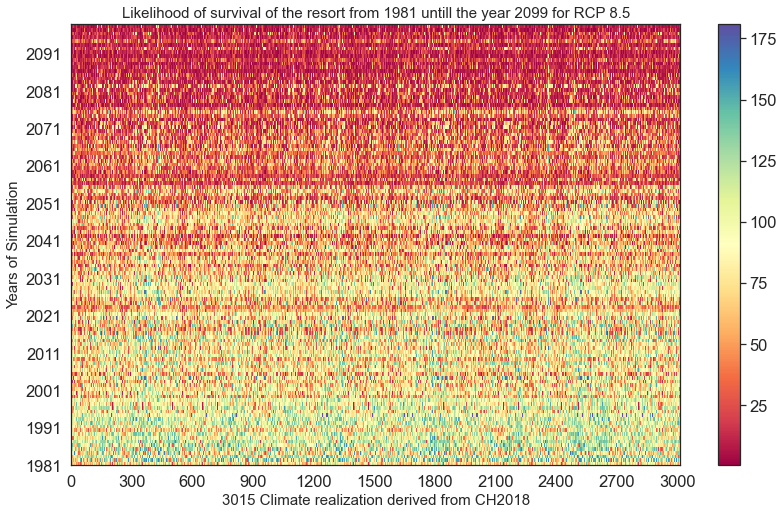

In [133]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [134]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [135]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [136]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [137]:
df26_all.shape

(118, 3016)

In [138]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [139]:
type(df26_all)

pandas.core.frame.DataFrame

In [140]:
thresholds_85_sce_m

array([  0,   1,   4, ..., 189, 197, 199], dtype=int64)

In [141]:
thresholds_45_sce_m

array([  3,   9,  12, ..., 184, 188, 196], dtype=int64)

In [142]:
df26_allColumns = df26_all.columns

In [143]:
df26_all[df26_allColumns[1]].iloc[0]

'89.38407142857156'

In [144]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_26_5'],sc_2_['isOverSnow_sc_26_11'],sc_3_['isOverSnow_sc_26_6'],sc_4_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_5_['isOverSnow_sc_26_3'],sc_6_['isOverSnow_sc_26_5'],sc_7_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_8_['isOverSnow_sc_26_5'],sc_9_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_26_1'],sc_11_['isOverSnow_sc_26_8'],sc_12_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_13_['isOverSnow_sc_26_4'],sc_14_['isOverSnow_sc_26_12'],sc_15_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_16_['isOverSnow_sc_26_9'],sc_17_['isOverSnow_sc_26_11'],sc_18_['isOverSnow_sc_26_2'],sc_19_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_20_['isOverSnow_sc_26_5'],sc_21_['isOverSnow_sc_26_4'],sc_22_['isOverSnow_sc_26_12'],sc_23_['isOverSnow_sc_26_12'],sc_24_['isOverSnow_sc_26_6'],sc_25_['isOverSnow_sc_26_8'],sc_26_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_27_['isOverSnow_sc_26_5'],sc_28_['isOverSnow_sc_26_9'],sc_29_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_30_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_26_10'],sc_32_['isOverSnow_sc_26_7'],sc_33_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],...,sc_2982_['isOverSnow_sc_26_2'],sc_2983_['isOverSnow_sc_26_6'],sc_2984_['isOverSnow_sc_26_3'],sc_2985_['isOverSnow_sc_26_12'],sc_2986_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2987_['isOverSnow_sc_26_10'],sc_2988_['isOverSnow_sc_26_6'],sc_2989_['isOverSnow_sc_26_7'],sc_2990_['isOverSnow_sc_26_4'],sc_2991_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2992_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2993_['isOverSnow_sc_26_9'],sc_2994_['isOverSnow_sc_26_11'],sc_2995_['isOverSnow_sc_26_10'],sc_2996_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2997_['isOverSnow_sc_26_8'],sc_2998_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2999_['isOverSnow_sc_26_8'],sc_3000_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3001_['isOverSnow_sc_26_5'],sc_3002_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3003_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3004_['isOverSnow_sc_26_2'],sc_3005_['isOverSnow_sc_26_5'],sc_3006_['isOverSnow_sc_26_6'],sc_3007_['isOverSnow_sc_26_3'],sc_3008_['isOverSnow_sc_26_7'],sc_3009_['isOverSnow_sc_26_4'],sc_3010_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3011_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3012_['isOverSnow_sc_26_11'],sc_3013_['isOverSnow_sc_26_8'],sc_3014_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3015_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp']
0,1981-1982,89.38407142857156,89.31263333333331,44.05296666666665,79.28866666666666,81.78636666666664,28.83353333333333,83.80303571428568,83.4251333333333,52.35370000000001,84.86083333333337,115.80013333333338,79.1423,54.77632142857145,52.5240333333333,88.23323333333339,39.18043333333335,73.06616666666667,75.6099333333334,48.804533333333296,117.41986666666672,48.64110000000004,46.75616666666664,78.20949999999998,109.83743333333338,112.0665333333334,39.363933333333314,25.618833333333356,82.00480000000003,77.39196666666653,40.48853333333333,40.68009999999999,25.661299999999986,78.21616666666665,...,96.95515999999999,126.80163999999999,96.30703999999994,92.72192000000001,66.82715999999996,43.58582142857143,81.0412,30.679440000000014,83.18419999999999,69.95244000000001,66.74812000000003,48.63804000000002,100.83335999999998,27.279440000000008,94.10420000000008,124.49756000000009,73.678,70.96928000000001,90.59647999999994,118.41807999999997,86.50651999999998,91.83995999999998,92.99239999999998,106.82091999999997,123.33672000000003,96.43679999999996,27.49425,77.69564000000008,87.45803999999998,47.55499999999992,81.03664,66.78836,87.57911999999996,73.85112000000001
1,1982-1983,126.0082142857143,50.340933333333275,34.60316666666664,78.12486666666666,99.29656666666665,98.85910000000003,128.9518214285714,123.7082,141.0448,91.61196666666665,64.64429999999999,134.07683333333344,41.5878928

In [145]:
thresholds_45_sce_m.shape

(2970,)

In [146]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
70.0
0
59


In [147]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [148]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [149]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [150]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

629
253
21


In [151]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

629
253
21


In [152]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

629
253
21


In [153]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

3016
2971
3016


In [154]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

3015
2970
3015


In [155]:
type(T1RCP85)

numpy.ndarray

In [156]:
T1RCP85.shape

(3016,)

In [157]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [158]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [159]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,6.0,0,7,8.0,0.0,18.0,8.0,4.0,53.0
1,8.0,0,13,6.0,0.0,61.0,9.0,6.0,30.0
2,8.0,0,99,8.0,1.0,42.0,6.0,6.0,98.0
3,9.0,0,113,6.0,1.0,81.0,8.0,9.0,160.0
4,7.0,0,125,9.0,3.0,26.0,8.0,13.0,16.0
5,3.0,0,163,6.0,3.0,111.0,8.0,14.0,110.0
6,9.0,0,177,5.0,4.0,12.0,8.0,19.0,171.0
7,7.0,0,185,7.0,4.0,37.0,8.0,20.0,186.0
8,9.0,0,190,9.0,4.0,76.0,9.0,28.0,68.0
9,5.0,0,191,1.0,4.0,80.0,6.0,28.0,149.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [160]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [161]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 2970
The lengthe of X is: 2970
***
The lengthe of Y is: 3015
The lengthe of X is: 3015


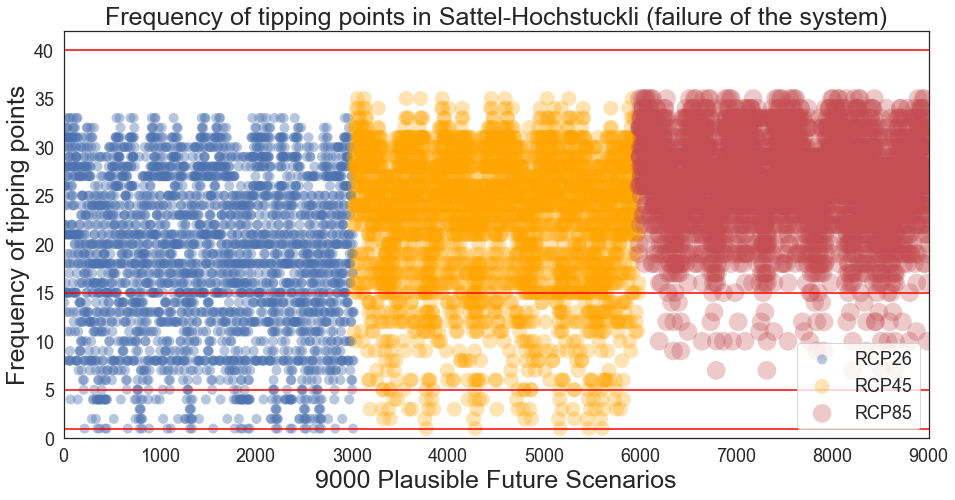

In [162]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

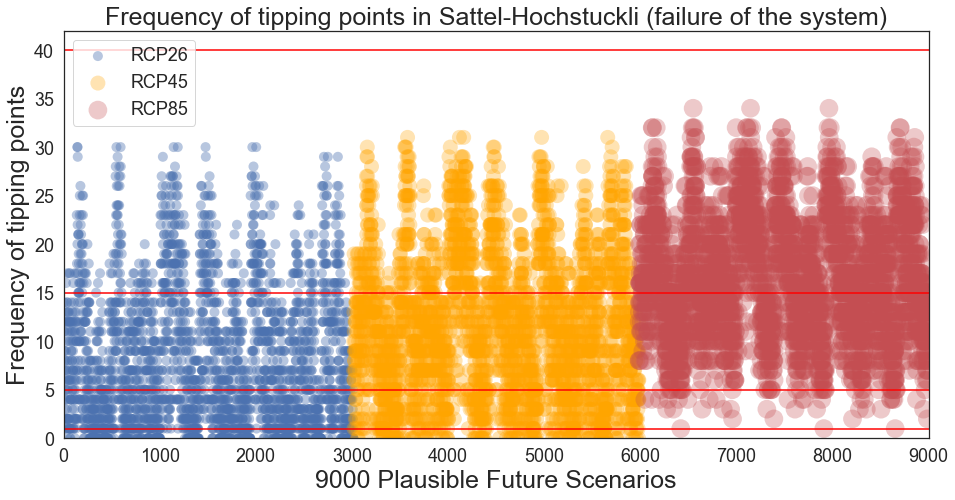

In [163]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

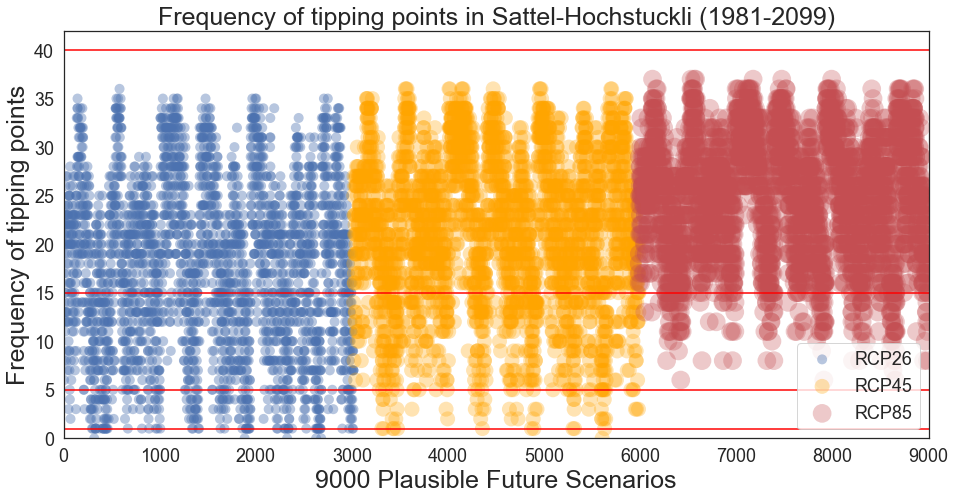

In [164]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [165]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,280.0,70.0,1,0,UZHModel,67.546979,57,110.174286,87.724107,156.705429,72.402464,131.767429,120.549786,72.259250,104.314036,130.872464,117.584179,126.196107,92.382464,71.299929,177.088500,107.840250,121.971429,126.946036,124.285571,118.757286,95.929786,...,16.774000,41.666536,16.462714,32.495250,23.050286,15.670964,61.855107,49.004429,13.861571,30.115679,70.056143,16.226000,10.629643,13.091321,11.404000,43.563357,10.913571,15.540821,67.221571,53.649214,26.501536,2.156286,12.309679,46.716714,35.754000,7.730071,32.523643,12.677000,6.207429,8.169964,63.961271,2.597373,0.631915,17.0
201,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,240.0,70.0,1,1,UZHModel,74.583913,57,121.077500,93.094333,160.866042,83.908875,137.087958,125.755500,84.302458,112.652292,138.721125,125.917208,133.463375,105.279250,80.030083,180.610458,115.655250,126.676958,133.543042,136.666208,128.948792,106.079375,...,19.569667,48.610958,19.206500,37.911125,26.892000,18.282792,70.462458,56.685250,16.171833,35.134958,73.541042,18.930333,12.401250,15.273208,13.304667,50.823917,12.732500,18.130958,71.427417,62.590750,30.918458,2.515667,14.361292,54.502833,41.713000,9.018417,37.944250,14.789833,7.242000,9.531625,63.961271,3.146102,0.663187,12.0
401,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,260.0,100.0,1,2,UZHModel,70.939525,57,115.778885,90.379885,159.294038,77.971885,134.235038,123.520538,77.817654,108.217500,134.960462,122.049154,129.610577,98.681269,75.634808,179.380038,111.640885,124.255731,130.347423,130.243769,123.890577,100.725192,...,18.064308,44.871654,17.729077,34.994885,24.823385,16.876423,66.228846,52.716731,14.927846,32.432269,72.035423,17.474154,11.447308,14.098346,12.281231,46.914385,11.753077,16.736269,69.622962,57.776077,28.540115,2.322154,13.256577,50.310308,38.504308,8.324692,35.025462,13.652154,6.684923,8.798423,63.961271,2.858898,0.549785,24.0
601,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,270.0,80.0,1,3,UZHModel,69.211375,57,113.040111,89.030259,157.990815,75.084037,132.967074,122.116667,74.935519,106.227704,132.978852,119.878333,127.849222,95.446963,73.476222,178.202889,109.731000,123.151074,128.610704,127.216926,121.318333,98.299037,...,17.395259,43.209741,17.072444,33.698778,23.904000,16.251370,64.079889,50.806296,14.374963,31.231074,71.061370,16.826963,11.023333,13.576185,11.826370,45.176815,11.317778,16.116407,68.408556,55.636222,27.483074,2.236148,12.765593,48.446963,37.078222,8.016370,33.728222,13.146519,6.437333,8.472556,63.961271,2.731186,0.607647,17.0
801,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,250.0,60.0,1,4,UZHModel,72.725209,57,118.333080,91.709640,160.269840,81.035680,135.604440,124.660160,80.930360,110.346200,136.794480,124.190920,131.475000,102.001720,77.773440,180.152920,113.608200,125.425960,131.944680,133.373520,126.483240,103.314200,...,18.786880,46.666520,18.438240,36.394680,25.816320,17.551480,68.330720,54.659040,15.524960,33.729560,72.759400,18.173120,11.905200,14.662280,12.772480,48.790960,12.223200,17.405720,70.610320,60.087120,29.681720,2.415040,13.786840,52.322720,40.044480,8.657680,36.426480,14.198240,6.952320,9.150360,63.961271,3.003220,0.683136,10.0
1001,1.54102,928.513753,5.881729,-1.156852,2.324987,0.66991,3.0,300.0,80.0,1,5,UZHModel,64.355601,57,104.363800,84.773067,154.283200,67.575633,129.565433,116.

In [166]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

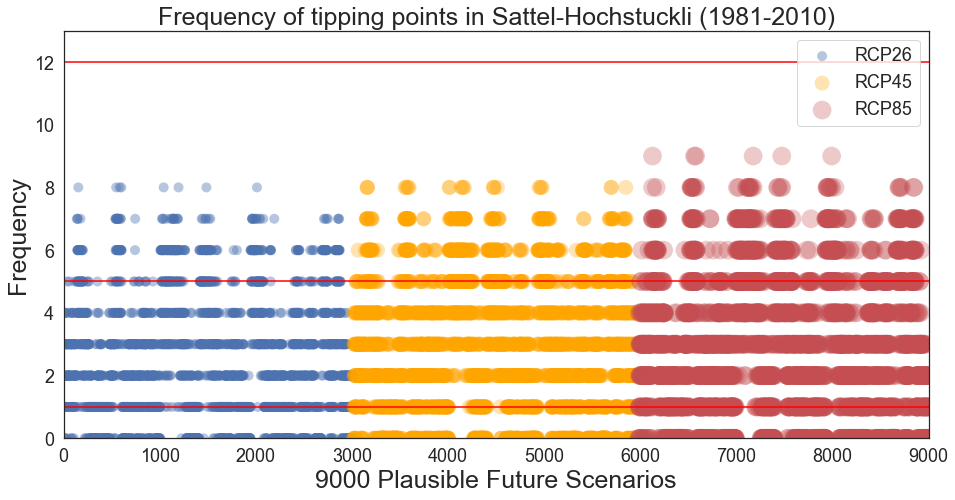

In [167]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [168]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [169]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [170]:
df_final_tipping_point_1980 = pd.concat((tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [171]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    586
2.0    556
1.0    541
3.0    518
4.0    281
6.0    244
5.0    225
7.0     57
8.0      8
Name: tippingPoint26_1980, dtype: int64
0.0    616
2.0    503
3.0    430
1.0    401
4.0    350
5.0    273
6.0    259
7.0    114
8.0     25
Name: tippingPoint45_1980, dtype: int64
0.0    577
2.0    471
3.0    464
1.0    460
5.0    322
4.0    304
6.0    220
7.0    153
8.0     39
9.0      6
Name: tippingPoint85_1980, dtype: int64


In [172]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    585
2.0    556
1.0    541
3.0    518
4.0    281
6.0    244
5.0    225
7.0     57
8.0      8
Name: tippingPoint26_1_1980, dtype: int64
0.0    615
2.0    503
3.0    430
1.0    401
4.0    350
5.0    273
6.0    259
7.0    114
8.0     25
Name: tippingPoint45_1_1980, dtype: int64
0.0    576
2.0    471
3.0    464
1.0    460
5.0    322
4.0    304
6.0    220
7.0    153
8.0     39
9.0      6
Name: tippingPoint85_1_1980, dtype: int64


In [173]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario26_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
16    66
14    66
12    66
10    66
8     66
6     66
4     66
2     66
40    66
44    66
41    66
1     66
39    66
37    66
35    66
33    66
31    66
29    66
27    66
25    66
23    66
21    66
19    66
17    66
15    66
13    66
11    66
9     66
7     66
5     66
3     66
0     66
Name: scenario45_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
1

In [174]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

195    45
118    45
192    45
190    45
180    45
178    45
170    45
166    45
162    45
144    45
138    45
134    45
132    45
128    45
126    45
124    45
114    45
198    45
112    45
82     45
78     45
66     45
58     45
56     45
52     45
46     45
40     45
38     45
22     45
10     45
8      45
6      45
194    45
5      45
193    45
113    45
191    45
187    45
185    45
181    45
177    45
173    45
169    45
165    45
163    45
157    45
153    45
131    45
125    45
119    45
103    45
7      45
101    45
99     45
93     45
87     45
85     45
75     45
71     45
69     45
57     45
51     45
31     45
23     45
17     45
13     45
2      45
Name: policy26_1980, dtype: int64
155    45
84     45
184    45
182    45
174    45
158    45
156    45
142    45
136    45
130    45
108    45
106    45
102    45
100    45
92     45
88     45
80     45
151    45
76     45
74     45
72     45
70     45
62     45
60     45
54     45
50     45
48     45
42     45
26     45
24    

In [175]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 5, thresholds_85_sce_m)

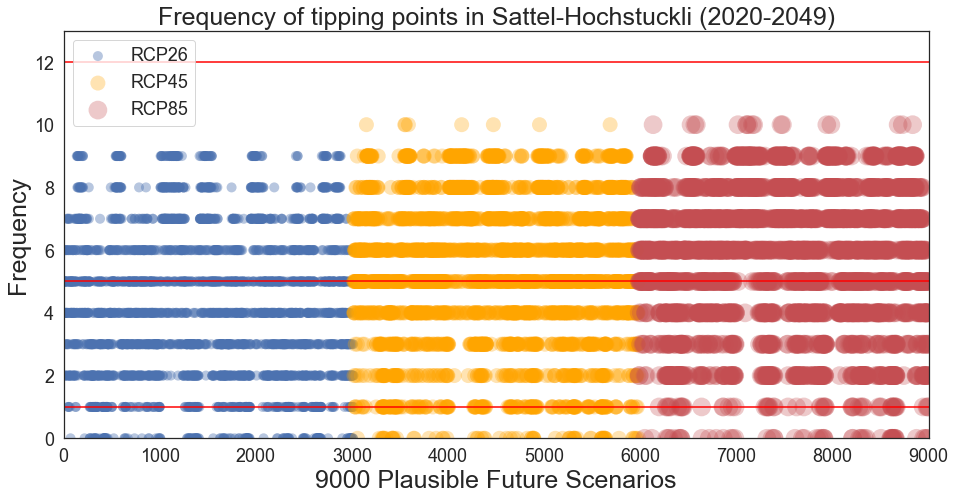

In [176]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [177]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [178]:
df_final_tipping_point_2020 = pd.concat((tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [179]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

5.0    469
2.0    431
3.0    418
4.0    383
7.0    321
6.0    278
1.0    249
8.0    191
0.0    157
9.0    119
Name: tippingPoint26_2020, dtype: int64
6.0     497
5.0     470
7.0     373
8.0     344
4.0     327
3.0     263
9.0     259
1.0     196
2.0     164
0.0      70
10.0      8
Name: tippingPoint45_2020, dtype: int64
7.0     570
6.0     444
8.0     379
5.0     363
9.0     344
4.0     331
2.0     265
3.0     189
1.0      59
0.0      55
10.0     17
Name: tippingPoint85_2020, dtype: int64


In [180]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

2.0    431
3.0    418
4.0    383
1.0    249
0.0    156
Name: tippingPoint26_1_2020, dtype: int64
4.0    327
3.0    263
1.0    196
2.0    164
0.0     69
Name: tippingPoint45_1_2020, dtype: int64
4.0    331
2.0    265
3.0    189
1.0     59
0.0     54
Name: tippingPoint85_1_2020, dtype: int64


In [181]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

39    66
6     64
28    63
20    61
34    61
4     61
44    59
14    58
24    57
19    55
9     54
25    52
37    50
27    49
5     48
33    45
43    45
31    42
13    42
35    41
10    39
41    38
11    38
1     35
32    35
0     33
7     32
12    30
3     28
26    28
38    27
23    25
36    23
18    20
16    15
2     15
30    13
21    13
15    13
42    12
8     11
40    11
17    10
29    10
22    10
Name: scenario26_2020, dtype: int64
39    59
6     55
28    52
20    50
4     44
34    44
24    42
14    42
19    39
44    38
25    38
9     37
37    35
5     33
33    32
27    31
11    24
31    24
43    24
41    22
10    21
32    20
13    19
0     18
35    18
1     15
7     14
3     13
12    12
26    11
18    10
23    10
38    10
36     9
30     8
2      7
42     6
22     6
16     5
21     5
40     4
15     4
17     4
8      3
29     2
Name: scenario45_2020, dtype: int64
39    60
28    56
6     54
20    48
44    47
4     46
34    45
14    43
24    41
19    36
37    36
9     32
33    30
2

In [182]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

56     30
10     29
173    29
66     28
126    28
162    28
99     28
6      27
163    27
191    27
51     27
170    27
195    27
113    27
124    26
125    26
138    26
157    26
114    26
40     26
187    26
58     26
23     25
85     25
17     25
178    25
71     25
185    25
118    25
13     25
82     24
75     24
38     24
31     24
57     24
131    24
112    24
22     24
128    24
134    24
144    24
153    24
177    24
8      24
7      24
192    24
194    24
101    23
166    23
193    23
52     23
46     22
198    22
103    22
165    22
169    22
181    22
190    22
2      22
78     21
87     21
93     21
119    21
180    21
69     20
132    20
5      19
Name: policy26_2020, dtype: int64
158    24
18     23
106    20
188    20
130    19
25     19
48     18
156    18
155    18
109    18
142    18
141    18
76     18
37     17
115    17
117    17
70     17
136    17
50     17
80     17
61     17
97     16
62     16
100    16
63     16
81     16
196    16
24     16
143    16
151   

In [183]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 5, thresholds_85_sce_m)

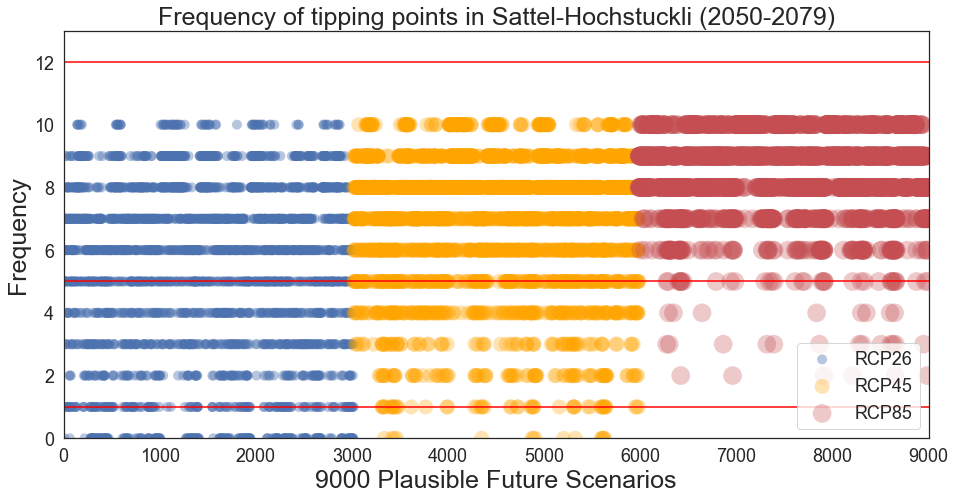

In [184]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [185]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [186]:
df_final_tipping_point_2050 = pd.concat((tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [187]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

7.0     468
8.0     430
6.0     412
9.0     309
5.0     302
3.0     243
0.0     235
4.0     217
1.0     174
2.0     145
10.0     81
Name: tippingPoint26_2050, dtype: int64
8.0     702
9.0     557
7.0     545
6.0     327
5.0     238
4.0     197
10.0    175
2.0      87
3.0      77
1.0      50
0.0      16
Name: tippingPoint45_2050, dtype: int64
9.0     1231
8.0      685
10.0     617
7.0      291
6.0      129
5.0       35
3.0       13
4.0        8
2.0        6
0.0        1
Name: tippingPoint85_2050, dtype: int64


In [188]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

3.0    243
0.0    234
4.0    217
1.0    174
2.0    145
Name: tippingPoint26_1_2050, dtype: int64
4.0    197
2.0     87
3.0     77
1.0     50
0.0     15
Name: tippingPoint45_1_2050, dtype: int64
3.0    13
4.0     8
2.0     6
Name: tippingPoint85_1_2050, dtype: int64


In [189]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

39    51
6     45
28    44
44    41
34    41
4     40
14    37
24    36
19    33
20    33
37    31
9     31
25    31
27    30
33    27
43    26
35    25
10    24
5     24
13    24
31    23
41    22
11    21
7     21
3     20
0     20
32    19
38    19
1     18
23    18
26    18
18    16
12    16
36    16
16    11
42     8
30     8
21     8
15     8
40     6
22     6
17     5
2      5
8      4
29     3
Name: scenario26_2050, dtype: int64
39    33
6     27
28    24
4     20
34    20
44    17
20    17
19    15
14    14
24    13
37    12
25    12
5     12
33    12
9     12
35    11
27    11
13    10
41    10
11    10
10    10
31    10
43     9
32     9
7      8
0      8
26     7
3      7
1      6
12     6
38     6
23     5
18     4
36     3
2      2
42     2
8      2
30     2
15     2
22     2
16     1
40     1
29     1
21     1
Name: scenario45_2050, dtype: int64
39    6
4     3
34    3
28    2
44    2
27    1
20    1
19    1
37    1
14    1
13    1
9     1
6     1
5     1
35    1
33    1

In [190]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

6      21
163    20
162    20
192    20
99     19
138    19
124    18
85     18
78     18
56     18
187    18
13     18
75     17
177    17
125    17
38     17
93     17
66     17
126    16
114    16
82     16
5      16
128    16
2      16
180    16
194    16
153    16
103    15
58     15
185    15
170    15
46     15
190    15
166    15
31     15
113    15
17     15
191    15
8      15
131    15
22     14
181    14
10     14
7      14
134    14
71     14
198    14
173    14
165    14
119    14
118    14
23     13
193    13
157    13
195    13
69     13
51     13
178    13
112    12
87     12
52     12
57     12
144    12
169    11
40     11
101    10
132     8
Name: policy26_2050, dtype: int64
76     13
25     13
158    12
106    12
109    10
92     10
130     9
18      9
100     9
60      9
111     9
19      9
136     9
80      8
188     8
115     8
61      8
9       8
142     8
174     8
123     7
26      7
63      7
74      7
81      7
35      7
145     7
102     6
143     6
117   

In [191]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 5, thresholds_85_sce_m)

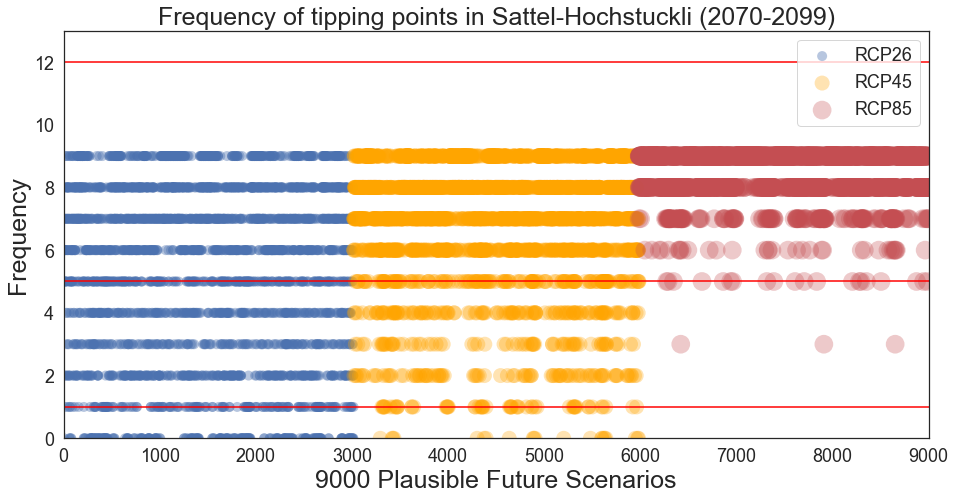

In [192]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [193]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [194]:
df_final_tipping_point_2070 = pd.concat((tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [195]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

8.0    503
7.0    399
9.0    372
6.0    358
5.0    282
2.0    276
0.0    238
4.0    233
3.0    180
1.0    175
Name: tippingPoint26_2070, dtype: int64
9.0    722
8.0    687
7.0    639
6.0    387
5.0    160
4.0    134
2.0     91
3.0     72
1.0     57
0.0     22
Name: tippingPoint45_2070, dtype: int64
9.0    2068
8.0     731
7.0     159
6.0      34
5.0      20
3.0       3
0.0       1
Name: tippingPoint85_2070, dtype: int64


In [196]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

2.0    276
0.0    237
4.0    233
3.0    180
1.0    175
Name: tippingPoint26_1_2070, dtype: int64
4.0    134
2.0     91
3.0     72
1.0     57
0.0     21
Name: tippingPoint45_1_2070, dtype: int64
3.0    3
Name: tippingPoint85_1_2070, dtype: int64


In [197]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

39    47
4     43
34    42
6     42
44    40
28    39
14    37
24    35
19    35
20    34
25    33
27    31
37    31
9     29
5     28
43    27
35    26
13    25
33    25
31    24
10    23
11    22
41    21
3     21
38    21
7     20
0     20
32    20
18    19
12    19
23    19
26    19
36    19
1     18
15    15
16    15
21    14
40    14
42    14
17    13
2     13
30    13
8     12
29    12
22    12
Name: scenario26_2070, dtype: int64
39    29
6     21
28    20
34    18
4     17
20    15
24    13
14    13
44    12
19    12
35    11
9     11
25    11
41    11
33    11
31    10
10    10
37    10
5     10
11     9
0      9
27     9
43     8
13     8
32     8
26     7
7      7
3      7
12     6
38     6
1      6
18     4
23     4
15     2
30     2
36     2
2      2
22     2
8      1
42     1
Name: scenario45_2070, dtype: int64
39    1
6     1
28    1
Name: scenario85_2070, dtype: int64


In [198]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

162    23
173    22
126    22
56     21
192    21
114    20
163    20
6      20
66     19
13     19
125    19
134    19
138    19
93     18
85     18
78     18
5      18
128    18
187    18
22     18
99     18
191    17
193    17
82     17
118    17
124    17
177    17
103    17
46     17
131    17
75     17
166    17
38     16
52     16
58     16
17     16
40     16
2      16
181    16
119    16
190    16
153    16
165    16
178    16
198    15
194    15
71     15
10     15
8      15
170    14
180    14
23     14
31     14
57     14
169    14
112    14
69     14
195    14
113    14
185    14
7      13
51     13
157    13
144    13
87     13
101    11
132     9
Name: policy26_2070, dtype: int64
18     13
158    12
25     12
115    11
76     11
130     9
106     9
109     9
80      8
100     8
74      7
33      7
136     7
142     7
81      7
143     7
60      7
9       7
188     6
24      6
95      6
135     6
92      6
111     6
63      6
42      6
14      6
55      6
12      6
35    

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [199]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [200]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [201]:
max_scenario.to_numpy()

array([99.93170833, 99.98768182, 99.88231034, 99.52893333, 99.90734615,
       99.92204   , 99.95796296, 99.91917241, 99.97346429, 99.98555556,
       99.72623077, 99.88662963, 99.8082    , 99.86389286, 99.74012   ,
       99.92411111, 99.59220833, 99.98086364, 99.11354167, 99.70416667,
       99.81012   , 99.87856   , 99.94916   , 99.98240741, 99.98128571,
       99.54241667, 99.80474074, 99.9855    , 99.80572414, 99.79554545,
       99.80496296, 99.95075862, 99.78137931, 99.95829167, 99.9134    ,
       99.74817241, 99.92608   , 99.78493333, 99.83381481, 99.84476667,
       99.84775   , 99.98919231, 99.84195   , 99.70966667, 99.92053571,
       99.88831034, 99.61872727, 99.9049    , 99.90038462, 99.99355   ,
       99.79736   , 99.97883333, 99.62531818, 99.86788462, 99.75304167,
       99.98425   , 99.92388889, 99.98196296, 99.95954545, 99.95751724,
       99.09333333, 99.99845833, 99.88146429, 99.98552   , 99.48086364,
       99.5187931 , 99.85726923, 99.87386667, 99.6702    , 99.47

In [202]:
min_scenario.to_numpy()

array([100.066875  , 100.18283333, 100.01472727, 100.6355    ,
       100.02154545, 100.39339286, 100.20092857, 100.01276667,
       100.06056   , 100.70154545, 100.14841379, 100.1132963 ,
       100.07025   , 100.1764    , 100.5269    , 100.13188462,
       100.267     , 100.31513793, 100.15115385, 100.03058333,
       100.40486667, 100.23817857, 100.41779167, 100.22783333,
       100.06569231, 100.203     , 100.00707143, 100.13796667,
       100.11765517, 100.09125926, 100.15846154, 100.00327586,
       100.02385714, 100.14104167, 100.05851852, 100.4001    ,
       100.65975   , 100.31113333, 100.69813793,  10.12064   ,
       100.0276    , 100.0217037 , 100.31525926, 100.27784615,
       100.0259    , 100.13784615,  10.13491667, 100.25366667,
       100.00238462, 100.01185   , 100.36663333, 100.37386667,
       100.0367    ,  10.06944828, 100.05305   , 100.01465   ,
       100.01685185, 100.19071429, 100.18415   ,  10.19133333,
        10.50385   , 100.160875  , 100.38089655, 100.02

In [203]:
max_scenario.shape

(118,)

## Changes in Good Days

In [204]:
max_scenario.to_numpy()

array([99.93170833, 99.98768182, 99.88231034, 99.52893333, 99.90734615,
       99.92204   , 99.95796296, 99.91917241, 99.97346429, 99.98555556,
       99.72623077, 99.88662963, 99.8082    , 99.86389286, 99.74012   ,
       99.92411111, 99.59220833, 99.98086364, 99.11354167, 99.70416667,
       99.81012   , 99.87856   , 99.94916   , 99.98240741, 99.98128571,
       99.54241667, 99.80474074, 99.9855    , 99.80572414, 99.79554545,
       99.80496296, 99.95075862, 99.78137931, 99.95829167, 99.9134    ,
       99.74817241, 99.92608   , 99.78493333, 99.83381481, 99.84476667,
       99.84775   , 99.98919231, 99.84195   , 99.70966667, 99.92053571,
       99.88831034, 99.61872727, 99.9049    , 99.90038462, 99.99355   ,
       99.79736   , 99.97883333, 99.62531818, 99.86788462, 99.75304167,
       99.98425   , 99.92388889, 99.98196296, 99.95954545, 99.95751724,
       99.09333333, 99.99845833, 99.88146429, 99.98552   , 99.48086364,
       99.5187931 , 99.85726923, 99.87386667, 99.6702    , 99.47

In [205]:
max_scenario.shape

(118,)

In [206]:
min_scenario.to_numpy()

array([100.066875  , 100.18283333, 100.01472727, 100.6355    ,
       100.02154545, 100.39339286, 100.20092857, 100.01276667,
       100.06056   , 100.70154545, 100.14841379, 100.1132963 ,
       100.07025   , 100.1764    , 100.5269    , 100.13188462,
       100.267     , 100.31513793, 100.15115385, 100.03058333,
       100.40486667, 100.23817857, 100.41779167, 100.22783333,
       100.06569231, 100.203     , 100.00707143, 100.13796667,
       100.11765517, 100.09125926, 100.15846154, 100.00327586,
       100.02385714, 100.14104167, 100.05851852, 100.4001    ,
       100.65975   , 100.31113333, 100.69813793,  10.12064   ,
       100.0276    , 100.0217037 , 100.31525926, 100.27784615,
       100.0259    , 100.13784615,  10.13491667, 100.25366667,
       100.00238462, 100.01185   , 100.36663333, 100.37386667,
       100.0367    ,  10.06944828, 100.05305   , 100.01465   ,
       100.01685185, 100.19071429, 100.18415   ,  10.19133333,
        10.50385   , 100.160875  , 100.38089655, 100.02

In [207]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [208]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =96.69 days
Uncertainty Band2 =96.69 days
****************************************End

Start************************************************************
Uncertainty Band1 =88.44 days
Uncertainty Band2 =88.56 days
****************************************End

Start************************************************************
Uncertainty Band1 =86.21 days
Uncertainty Band2 =86.08 days
****************************************End



In [209]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =86.16 days
Uncertainty Band2 =86.03 days
****************************************End

Start************************************************************
Uncertainty Band1 =71.05 days
Uncertainty Band2 =71.17 days
****************************************End

Start************************************************************
Uncertainty Band1 =71.87 days
Uncertainty Band2 =71.74 days
****************************************End



In [210]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =68.11 days
Uncertainty Band2 =67.98 days
****************************************End

Start************************************************************
Uncertainty Band1 =62.55 days
Uncertainty Band2 =62.55 days
****************************************End

Start************************************************************
Uncertainty Band1 =51.80 days
Uncertainty Band2 =51.78 days
****************************************End



In [211]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =62.96 days
Uncertainty Band2 =63.08 days
****************************************End

Start************************************************************
Uncertainty Band1 =52.79 days
Uncertainty Band2 =52.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =36.01 days
Uncertainty Band2 =36.00 days
****************************************End



## Changes in Financial situation

In [212]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [213]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [214]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =4.23 days
Uncertainty Band2 =4.23 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.25 days
Uncertainty Band2 =4.25 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.19 days
Uncertainty Band2 =4.19 days
****************************************End



In [215]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =3.96 days
Uncertainty Band2 =3.96 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.77 days
Uncertainty Band2 =3.77 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.64 days
Uncertainty Band2 =3.64 days
****************************************End



In [216]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =3.77 days
Uncertainty Band2 =3.77 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.54 days
Uncertainty Band2 =3.54 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.98 days
Uncertainty Band2 =2.97 days
****************************************End



In [217]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =3.63 days
Uncertainty Band2 =3.63 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.14 days
Uncertainty Band2 =3.14 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.35 days
Uncertainty Band2 =2.35 days
****************************************End



## Changes in Artificial Snow

In [218]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [219]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =95.43 days
Uncertainty Band2 =95.52 days
****************************************End

Start************************************************************
Uncertainty Band1 =95.49 days
Uncertainty Band2 =95.49 days
****************************************End

Start************************************************************
Uncertainty Band1 =94.43 days
Uncertainty Band2 =94.31 days
****************************************End



In [220]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =86.57 days
Uncertainty Band2 =86.57 days
****************************************End

Start************************************************************
Uncertainty Band1 =83.94 days
Uncertainty Band2 =83.66 days
****************************************End

Start************************************************************
Uncertainty Band1 =72.95 days
Uncertainty Band2 =72.86 days
****************************************End



In [221]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =73.55 days
Uncertainty Band2 =73.46 days
****************************************End

Start************************************************************
Uncertainty Band1 =66.27 days
Uncertainty Band2 =66.19 days
****************************************End

Start************************************************************
Uncertainty Band1 =46.05 days
Uncertainty Band2 =45.97 days
****************************************End



In [222]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =69.83 days
Uncertainty Band2 =69.72 days
****************************************End

Start************************************************************
Uncertainty Band1 =51.54 days
Uncertainty Band2 =51.71 days
****************************************End

Start************************************************************
Uncertainty Band1 =23.03 days
Uncertainty Band2 =23.02 days
****************************************End



## End